# Exploratory Data Analysis

<!-- TABLE OF CONTENTS -->
<details>
  <summary>Table of Contents</summary>
  <ol>
    <li><a href="#1">Climate from 1980 to 2023</a></li>
    <li><a href="#2">Read merged dataset from 2018 to 2020</a></li>
    <li><a href="#3">Region dengue data from 2015 to 2020</a></li>
    <li><a href="#4">SeroType data from 2018 to 2023</a></li>
    <li><a href="#5">Read Merged dataset from 2018 to 2023</a></li>
    <li><a href="#6">Dengue, Rainfall, Temperature distribution from 2018 to 2023</a></li>
    <li><a href="#7">Comparing google trends, temperature and rain with dengue from 2018-2023]</a></li>
    <li><a href="#8">Trend, seasonal component of the dengue time series from 2018 to 2023 and 2012 to 2023</a></li>
    <li><a href="#9">Features lags with highest correlation</a></li>
  </ol>
</details>


## Import

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from datetime import datetime
from operator import itemgetter
import warnings
from itertools import groupby
from statsmodels.tsa.seasonal import seasonal_decompose
from folium.plugins import TimeSliderChoropleth
from branca.element import Figure
from shapely.geometry import Point, Polygon, MultiPolygon, LinearRing
import geojson
import geopandas as gpd
import fiona
import imageio
import contextily as ctx
import os
import matplotlib.animation as animation
import cv2
from PIL import Image

%matplotlib inline
sns.set_style('whitegrid') # set style for visualization
warnings.filterwarnings('ignore')

fiona.drvsupport.supported_drivers['kml'] = 'rw' # enable KML support which is disabled by default
fiona.drvsupport.supported_drivers['KML'] = 'rw' # enable KML support which is disabled 

In [2]:
def compare_timeseries(x1,y1,name1,x2,y2,name2):
    '''
    x1,y1: time series 1
    x2,y2: time series 2
    '''
    
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel(name1, color=color) #First X-Axis label
    ax1.plot(x1, y1, color=color) #First time series
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.tick_params(axis='x',rotation=45)
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    
    color = 'tab:blue'
    ax2.set_ylabel(name2, color=color) #Second X-axis label
    ax2.plot(x2, y2, color=color)  #Second time series
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.tick_params(axis='x',rotation=45)
    
    fig.tight_layout()
    plt.legend(loc='upper left')
    plt.title(f'Compare Time Series of {name1} and {name2}')
    plt.show()

In [3]:
def plot_timeseries(x,y,graph_name,axv_value,axv_name):
    '''
    x,y: time series
    graph_name: title of graph
    axv_value: string date value of verticle line to plot
    axv_name: label of vertical line
    '''
    
    fig, ax = plt.subplots()

    color = 'tab:red'
    ax.set_xlabel('Date')
    ax.set_ylabel(graph_name, color=color) #X-Axis label
    ax.plot(x, y, color=color) #time series
    ax.tick_params(axis='y', labelcolor=color)
    ax.axvline(pd.to_datetime(axv_value), color = 'black', label = axv_name) #Line
    fig.tight_layout()
    plt.legend(loc='upper left')
    plt.title(f'Time Series of {graph_name}')
    plt.show()

In [4]:
def single_variable_barplot(df,feature,p_color,percentile):
    '''
    Plot bar plot for single variable
    df: dataframe
    feature: feature name
    p_color: primary color of bar plot
    percentile: percentile to highlight (e.g. 0.75)
    '''
    data = df[feature].groupby(df.index.month).mean()
    threshold = data.quantile(percentile)
    data.plot(kind="bar",color=[p_color if x > threshold else '0.8' for x in data])
    plt.axhline(threshold, color='red', linestyle='solid', linewidth=1.1)
    plt.title(f'Months of {feature}')
    plt.ylabel(f'{feature}')
    plt.xlabel('Month')


## 1. Climate from 1980 to 2023 <a id="1"></a>

---
### Read data

In [2]:
# Import climate data
climate_wk = pd.read_csv("../datasets/climate_wk.csv")

# Convert the time column to datetime format
climate_wk['DateTime'] = pd.to_datetime(climate_wk['DateTime'])

In [3]:
climate_wk.head(3)

,DateTime,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C)
0,1980-01-06,27.676001,7.534925,2.850000,31.522349,32.8,24.924584
1,1980-01-13,27.676001,7.534925,1.128571,31.522349,32.8,24.924584
2,1980-01-20,27.676001,7.534925,39.357143,31.522349,32.8,24.924584


In [4]:
climate_wk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2253 entries, 0 to 2252
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   DateTime                   2253 non-null   datetime64[ns]
 1   Mean Temperature (°C)      2253 non-null   float64       
 2   Mean Wind Speed (km/h)     2253 non-null   float64       
 3   Daily Rainfall Total (mm)  2253 non-null   float64       
 4   Maximum Temperature (°C)   2253 non-null   float64       
 5   Max Wind Speed (km/h)      2253 non-null   float64       
 6   Minimum Temperature (°C)   2253 non-null   float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 123.3 KB


In [5]:
# import climate_daily
climate_daily = pd.read_csv("../datasets/climate_daily.csv")

# Convert the time column to datetime format
climate_daily['DateTime'] = pd.to_datetime(climate_daily['DateTime'])

In [6]:
climate_daily.head(3)

,Max Wind Speed (km/h),Daily Rainfall Total (mm),Minimum Temperature (°C),Day,Year,Station,Mean Wind Speed (km/h),Month,Mean Temperature (°C),Maximum Temperature (°C),DateTime
0,32.8,0.0,24.924584,1,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-01
1,32.8,0.0,24.924584,2,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-02
2,32.8,0.0,24.924584,3,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-03


In [7]:
climate_daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15765 entries, 0 to 15764
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Max Wind Speed (km/h)      15765 non-null  float64       
 1   Daily Rainfall Total (mm)  15765 non-null  float64       
 2   Minimum Temperature (°C)   15765 non-null  float64       
 3   Day                        15765 non-null  int64         
 4   Year                       15765 non-null  int64         
 5   Station                    15765 non-null  object        
 6   Mean Wind Speed (km/h)     15765 non-null  float64       
 7   Month                      15765 non-null  int64         
 8   Mean Temperature (°C)      15765 non-null  float64       
 9   Maximum Temperature (°C)   15765 non-null  float64       
 10  DateTime                   15765 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(6), int64(3), object(1)
memory usage:

---
### Regression Line Plots to Explore Relationships between Features

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_6022/520208917.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(climate_wk.corr(), dtype=None)
/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_6022/520208917.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(climate_wk.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)


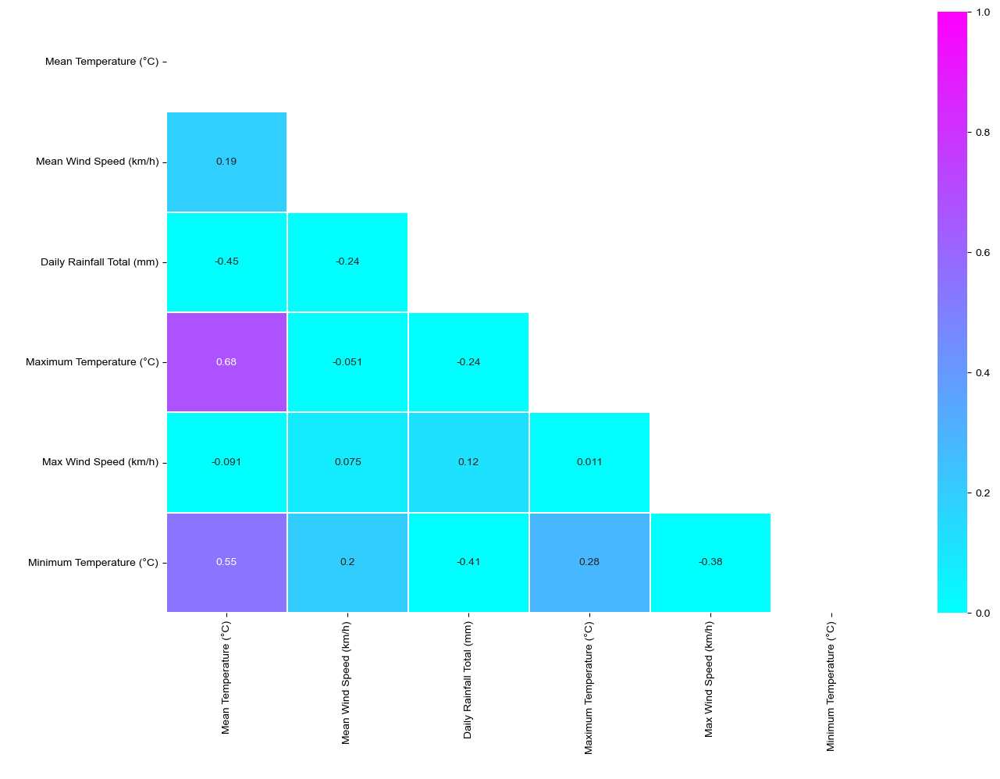

In [ ]:
# First use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features
# Establish figure size
fig = plt.subplots(figsize=(15, 10))

# Create a mask for the top half (repeated values) of the heat map
mask = np.zeros_like(climate_wk.corr(), dtype=None)
mask[np.triu_indices_from(mask)]=True

# Plot the correlation heat map
sns.heatmap(climate_wk.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)
sns.set(font_scale=0.5)

# Display the heat map
plt.show();

In [ ]:
# create a function for the use of regression plots to explore relationships between features
def reg_plot(x,y,df,hue=None):
    sns.lmplot(df, x=x,y=y,hue=hue, height=5, aspect=1.5)
    plt.title(y.replace("_", " ").title()+" vs "+x.replace("_", " ").title())
    plt.xlabel(x.replace("_", " ").title())
    plt.ylabel(y.replace("_", " ").title())

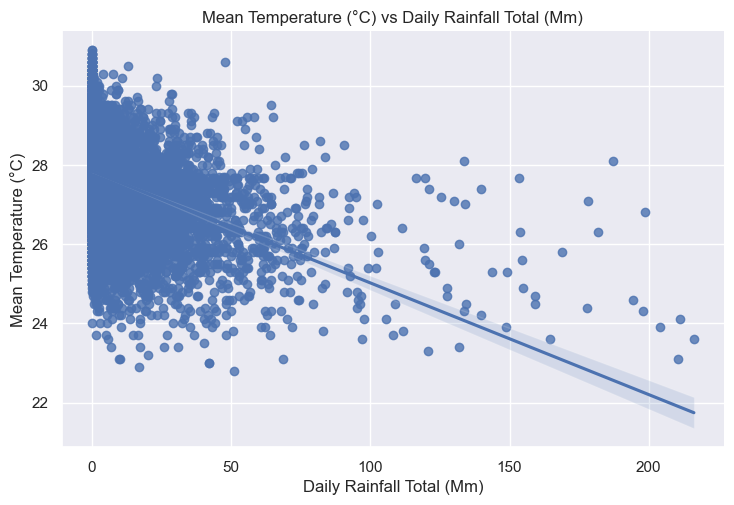

In [ ]:
# regression line to examine relationship between rainfall and mean/max/min temperature
reg_plot('Daily Rainfall Total (mm)','Mean Temperature (°C)', climate_daily, hue=None)

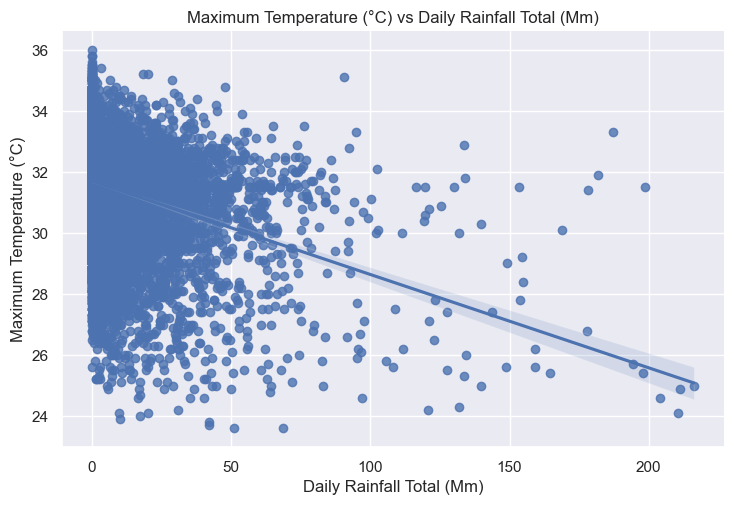

In [ ]:
# regression line to examine relationship between rainfall and mean/max/min temperature
reg_plot('Daily Rainfall Total (mm)','Maximum Temperature (°C)', climate_daily, hue=None)

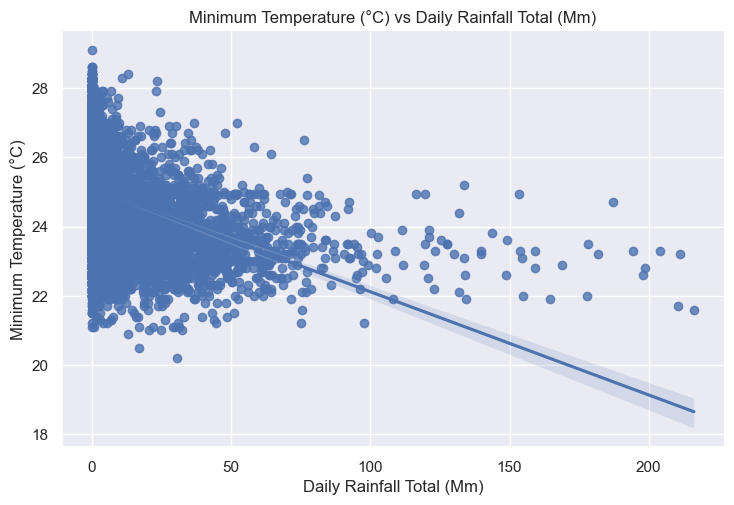

In [ ]:
# regression line to examine relationship between rainfall and mean/max/min temperature
reg_plot('Daily Rainfall Total (mm)','Minimum Temperature (°C)', climate_daily, hue=None)

---
### Time Series Line Plots

#### Minimum, Maximum, Mean Temperature Data collected at Changi Station from 1980 to 2023

In [ ]:
climate_wk.columns

Index(['DateTime', 'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)'],
      dtype='object')

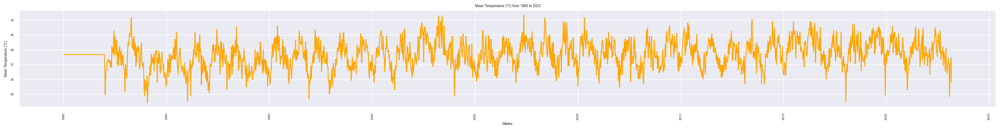

In [ ]:
# Mean Temperature over the weeks, 1980-2023
plt.figure(figsize=(30, 3))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk['Mean Temperature (°C)']

plt.plot(x,y,color='orange')

plt.title(label='Mean Temperature (°C) from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Mean Temperature (°C)')
plt.xticks(rotation=90);

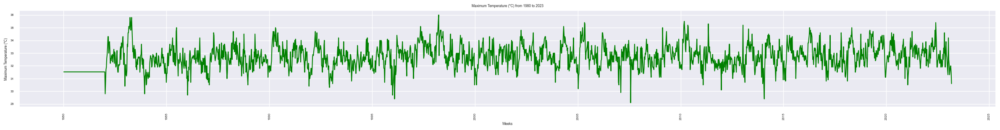

In [ ]:
# Maximum Temperature over the weeks, 1980-2023
plt.figure(figsize=(30, 3))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk['Maximum Temperature (°C)']

plt.plot(x,y, color='green')

plt.title(label='Maximum Temperature (°C) from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Maximum Temperature (°C)')
plt.xticks(rotation=90);

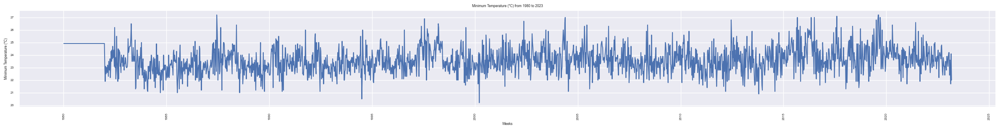

In [ ]:
# Minimum Temperature over the weeks, 1980-2023
plt.figure(figsize=(30, 3))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk['Minimum Temperature (°C)']

plt.plot(x,y)

plt.title(label='Minimum Temperature (°C) from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Minimum Temperature (°C)')
plt.xticks(rotation=90);

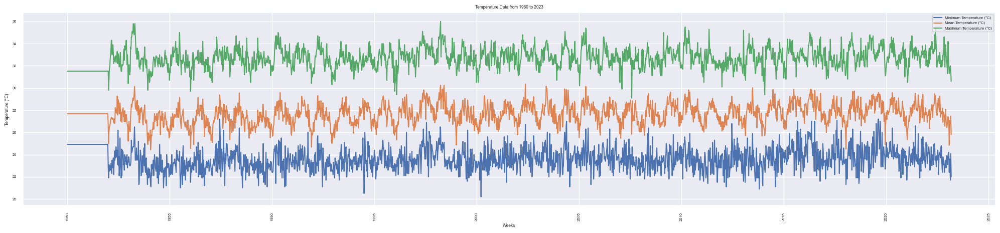

In [ ]:
# Temperature Data over the weeks, 1980-2023
plt.figure(figsize=(25, 5))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk[['Minimum Temperature (°C)', 'Mean Temperature (°C)', 'Maximum Temperature (°C)']]

plt.plot(x,y)

plt.title(label='Temperature Data from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Temperature (°C)')
plt.xticks(rotation=90)

# Add legend
plt.legend(['Minimum Temperature (°C)', 'Mean Temperature (°C)', 'Maximum Temperature (°C)'], loc='upper right');

#### Mean and Maximum Wind Speed Data collected at Changi Station from 1980 to 2023

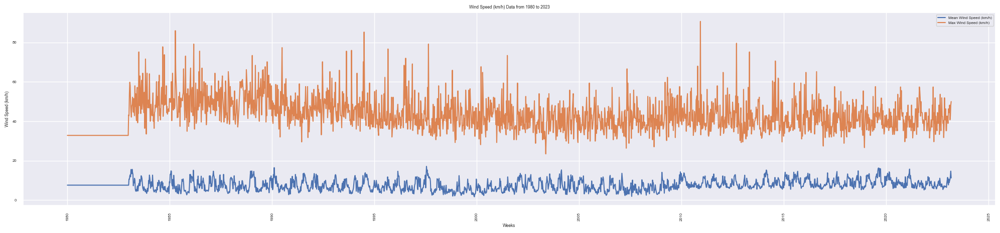

In [ ]:
# Wind Speed Data over the weeks, 1980-2023
plt.figure(figsize=(25, 5))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk[['Mean Wind Speed (km/h)', 'Max Wind Speed (km/h)', ]]

plt.plot(x,y)

plt.title(label='Wind Speed (km/h) Data from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Wind Speed (km/h)')
plt.xticks(rotation=90)

# Add legend
plt.legend(['Mean Wind Speed (km/h)', 'Max Wind Speed (km/h)'], loc='upper right');

#### Daily Rainfall Total (mm) collected at Changi Station from 1980 to 2023

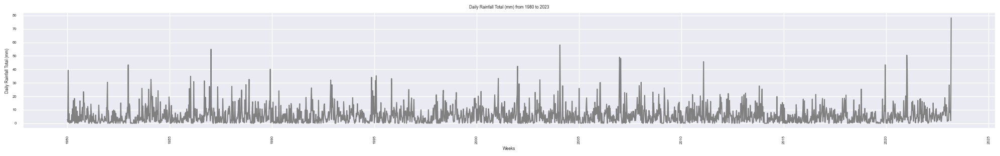

In [ ]:
# Daily Rainfall Total(mm) over the weeks, 1980-2023
plt.figure(figsize=(25, 3))

# Define X and y
x = climate_wk['DateTime']
y = climate_wk['Daily Rainfall Total (mm)']

plt.plot(x,y, color='grey')

plt.title(label='Daily Rainfall Total (mm) from 1980 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Daily Rainfall Total (mm)')
plt.xticks(rotation=90);

---
### Boxplot

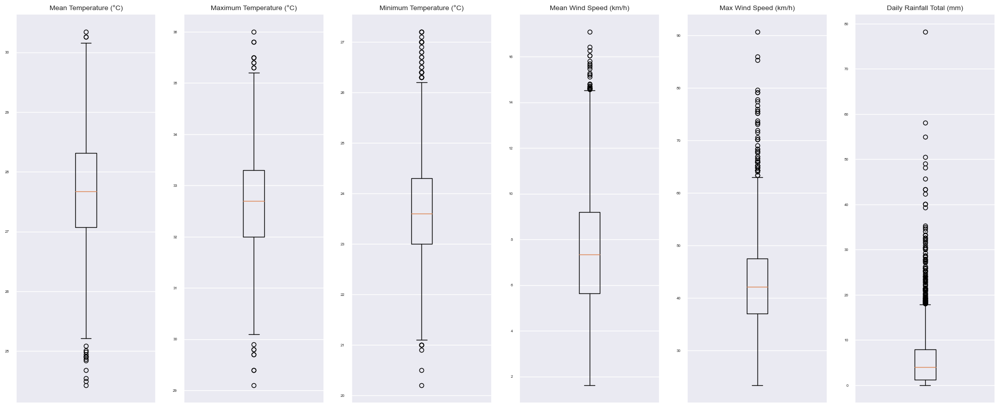

In [ ]:
# establish figure size
plt.figure(figsize=[25, 10])

# subplot #1
# plt.subplot(1, 6, 1) means we have 1 row, 9 columns, and are referencing plot 1.
ax1 = plt.subplot(1,6,1) 
ax1.set_title('Mean Temperature (°C)', fontsize=10) 
ax1.boxplot(climate_wk['Mean Temperature (°C)'])
ax1.set_xticks([])

# subplot #2           
# plt.subplot(1, 6, 2) means we have 1 row, 9 columns, and are referencing plot 2.
ax2 = plt.subplot(1,6,2) 
ax2.set_title('Maximum Temperature (°C)', fontsize=10)
ax2.boxplot(climate_wk['Maximum Temperature (°C)']) 
ax2.set_xticks([])

# subplot #3
# plt.subplot(1, 6, 3) means we have 1 row, 9 columns, and are referencing plot 3.
ax3 = plt.subplot(1,6,3) 
ax3.set_title('Minimum Temperature (°C)', fontsize=10) 
ax3.boxplot(climate_wk['Minimum Temperature (°C)']) 
ax3.set_xticks([])

# subplot #4
# plt.subplot(1, 6, 4) means we have 1 row, 9 columns, and are referencing plot 4.
ax4 = plt.subplot(1,6,4) 
ax4.set_title('Mean Wind Speed (km/h)', fontsize=10) 
ax4.boxplot(climate_wk['Mean Wind Speed (km/h)'])
ax4.set_xticks([])

# subplot #5
# plt.subplot(1, 6, 5) means we have 1 row, 9 columns, and are referencing plot 5.
ax5 = plt.subplot(1,6,5) 
ax5.set_title('Max Wind Speed (km/h)', fontsize=10)
ax5.boxplot(climate_wk['Max Wind Speed (km/h)'])
ax5.set_xticks([])

# subplot #6
# plt.subplot(1, 6, 6) means we have 1 rows, 9 columns, and are referencing plot 6.
ax6 = plt.subplot(1,6,6)
ax6.set_title('Daily Rainfall Total (mm)', fontsize=10)
ax6.boxplot(climate_wk['Daily Rainfall Total (mm)'])
ax6.set_xticks([]);

---
### Time Series Boxplot 
> * Weekly Trend
> * Monthly Trend
> * Yearly Trend

In [18]:
climate_daily.head(3)

,Max Wind Speed (km/h),Daily Rainfall Total (mm),Minimum Temperature (°C),Day,Year,Station,Mean Wind Speed (km/h),Month,Mean Temperature (°C),Maximum Temperature (°C),DateTime
0,32.8,0.0,24.924584,1,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-01
1,32.8,0.0,24.924584,2,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-02
2,32.8,0.0,24.924584,3,1980,Changi,7.534925,1,27.676001,31.522349,1980-01-03


In [19]:
climate_daily['Day'] = climate_daily.DateTime.apply(lambda x: x.strftime("%a"))

In [20]:
climate_daily['Month'] = climate_daily.DateTime.apply(lambda x: x.strftime("%b"))

In [21]:
climate_daily['Year'] = climate_daily.DateTime.apply(lambda x : x.strftime('%Y'))

In [22]:
climate_daily['DateTime'] = pd.to_datetime(climate_daily.DateTime)
climate_daily = climate_daily.set_index('DateTime')

In [23]:
climate_daily.head(3)

,Max Wind Speed (km/h),Daily Rainfall Total (mm),Minimum Temperature (°C),Day,Year,Station,Mean Wind Speed (km/h),Month,Mean Temperature (°C),Maximum Temperature (°C)
DateTime,,,,,,,,,,
1980-01-01,32.8,0.0,24.924584,Tue,1980,Changi,7.534925,Jan,27.676001,31.522349
1980-01-02,32.8,0.0,24.924584,Wed,1980,Changi,7.534925,Jan,27.676001,31.522349
1980-01-03,32.8,0.0,24.924584,Thu,1980,Changi,7.534925,Jan,27.676001,31.522349


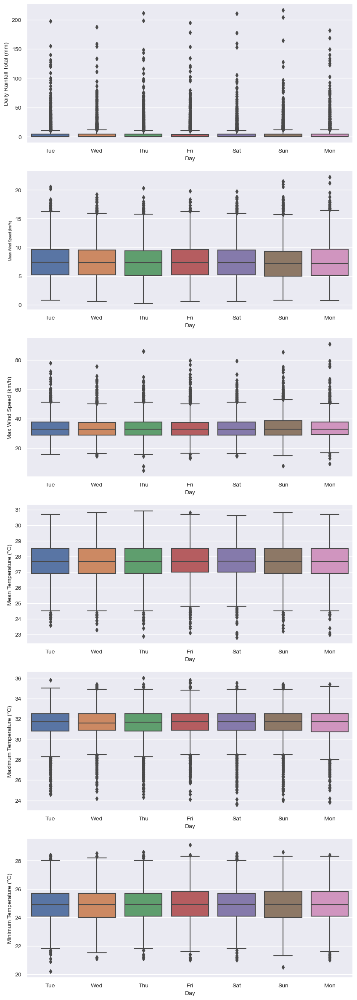

In [45]:
# weekly boxplots 

# establish figure size
plt.figure(figsize=(10, 30))

# subplot #1
# plt.subplot(6, 1, 1) means we have 6 rows, 1 column, and are referencing plot 1.
ax1 = plt.subplot(6, 1, 1) 
ax1.set_xlabel('Group', fontsize=10)
ax1.set_ylabel('Value', fontsize=10)
ax1.tick_params(axis='x', labelsize=10)
ax1.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Daily Rainfall Total (mm)'], 
            ax = ax1)

# subplot #2
# plt.subplot(6, 1, 2) means we have 6 rows, 1 column, and are referencing plot 2.
ax2 = plt.subplot(6, 1, 2)
ax2.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax2.tick_params(axis='x', labelsize=10)
ax2.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Mean Wind Speed (km/h)'],
            ax = ax2)

# subplot #3
# plt.subplot(6, 1, 3) means we have 6 rows, 1 column, and are referencing plot 3.
ax3 = plt.subplot(6, 1, 3) 
ax3.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax3.tick_params(axis='x', labelsize=10)
ax3.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Max Wind Speed (km/h)'], 
            ax = ax3)

# subplot #4
# plt.subplot(6, 1, 4) means we have 6 rows, 1 column, and are referencing plot 4. 
ax4 = plt.subplot(6, 1, 4) 
ax4.set_xlabel('Group', fontsize=10)
ax4.set_ylabel('Value', fontsize=10)
ax4.tick_params(axis='x', labelsize=10)
ax4.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Mean Temperature (°C)'], 
            ax = ax4)

# subplot #5 
# plt.subplot(6, 1, 5) means we have 6 rows, 1 column, and are referencing plot 5. 
ax5 = plt.subplot(6, 1, 5) 
ax5.set_xlabel('Group', fontsize=10)
ax5.set_ylabel('Value', fontsize=10)
ax5.tick_params(axis='x', labelsize=10)
ax5.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Maximum Temperature (°C)'], 
            ax = ax5)

# subplot #6
# plt.subplot(6, 1, 6) means we have 6 rows, 1 column, and are referencing plot 6. 
ax6 = plt.subplot(6, 1, 6) 
ax6.set_xlabel('Group', fontsize=10)
ax6.set_ylabel('Value', fontsize=10)
ax6.tick_params(axis='x', labelsize=10)
ax6.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.Day, 
            y = climate_daily['Minimum Temperature (°C)'], 
            ax = ax6);


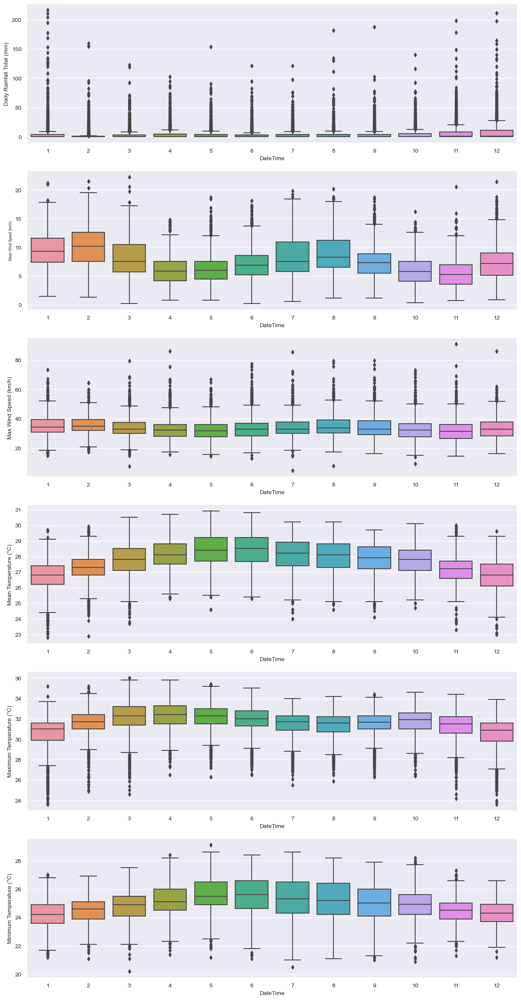

In [40]:
# monthly boxplots 

# establish figure size
plt.figure(figsize=(15, 30))

# subplot #1
# plt.subplot(6, 1, 1) means we have 6 rows, 1 column, and are referencing plot 1.
ax1 = plt.subplot(6, 1, 1) 
ax1.set_xlabel('Group', fontsize=10)
ax1.set_ylabel('Value', fontsize=10)
ax1.tick_params(axis='x', labelsize=10)
ax1.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Daily Rainfall Total (mm)'], 
            ax = ax1)

# subplot #2
# plt.subplot(6, 1, 2) means we have 6 rows, 1 column, and are referencing plot 2.
ax2 = plt.subplot(6, 1, 2)
ax2.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax2.tick_params(axis='x', labelsize=10)
ax2.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Mean Wind Speed (km/h)'],
            ax = ax2)

# subplot #3
# plt.subplot(6, 1, 3) means we have 6 rows, 1 column, and are referencing plot 3.
ax3 = plt.subplot(6, 1, 3) 
ax3.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax3.tick_params(axis='x', labelsize=10)
ax3.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Max Wind Speed (km/h)'], 
            ax = ax3)

# subplot #4
# plt.subplot(6, 1, 4) means we have 6 rows, 1 column, and are referencing plot 4. 
ax4 = plt.subplot(6, 1, 4) 
ax4.set_xlabel('Group', fontsize=10)
ax4.set_ylabel('Value', fontsize=10)
ax4.tick_params(axis='x', labelsize=10)
ax4.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Mean Temperature (°C)'], 
            ax = ax4)

# subplot #5 
# plt.subplot(6, 1, 5) means we have 6 rows, 1 column, and are referencing plot 5. 
ax5 = plt.subplot(6, 1, 5) 
ax5.set_xlabel('Group', fontsize=10)
ax5.set_ylabel('Value', fontsize=10)
ax5.tick_params(axis='x', labelsize=10)
ax5.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Maximum Temperature (°C)'], 
            ax = ax5)

# subplot #6
# plt.subplot(6, 1, 6) means we have 6 rows, 1 column, and are referencing plot 6. 
ax6 = plt.subplot(6, 1, 6) 
ax6.set_xlabel('Group', fontsize=10)
ax6.set_ylabel('Value', fontsize=10)
ax6.tick_params(axis='x', labelsize=10)
ax6.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.month, 
            y = climate_daily['Minimum Temperature (°C)'], 
            ax = ax6);


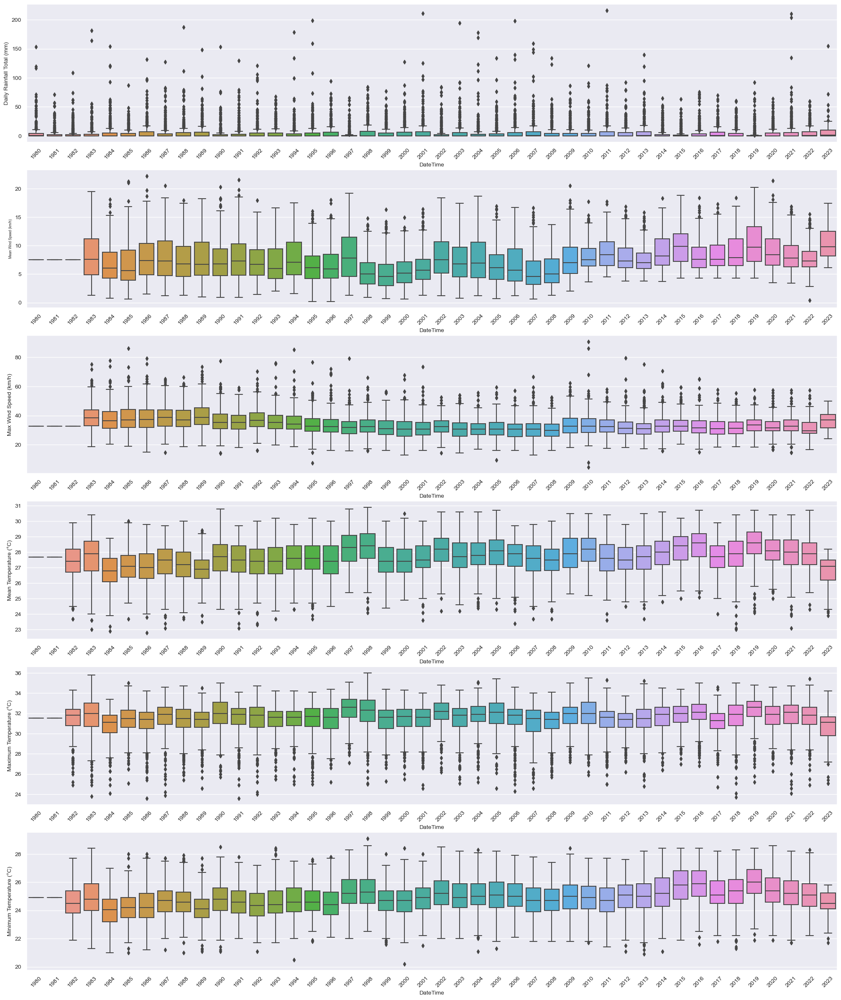

In [44]:
# yearly boxplots 

# establish figure size
plt.figure(figsize=(25, 30))

# subplot #1
# plt.subplot(6, 1, 1) means we have 6 rows, 1 column, and are referencing plot 1.
ax1 = plt.subplot(6, 1, 1) 
ax1.set_xlabel('Group', fontsize=10)
ax1.set_ylabel('Value', fontsize=10)
ax1.tick_params(axis='x', labelsize=10, rotation=45)
ax1.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Daily Rainfall Total (mm)'], 
            ax = ax1)

# subplot #2
# plt.subplot(6, 1, 2) means we have 6 rows, 1 column, and are referencing plot 2.
ax2 = plt.subplot(6, 1, 2)
ax2.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax2.tick_params(axis='x', labelsize=10, rotation=45)
ax2.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Mean Wind Speed (km/h)'],
            ax = ax2)

# subplot #3
# plt.subplot(6, 1, 3) means we have 6 rows, 1 column, and are referencing plot 3.
ax3 = plt.subplot(6, 1, 3) 
ax3.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax3.tick_params(axis='x', labelsize=10, rotation=45)
ax3.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Max Wind Speed (km/h)'], 
            ax = ax3)

# subplot #4
# plt.subplot(6, 1, 4) means we have 6 rows, 1 column, and are referencing plot 4. 
ax4 = plt.subplot(6, 1, 4) 
ax4.set_xlabel('Group', fontsize=10)
ax4.set_ylabel('Value', fontsize=10)
ax4.tick_params(axis='x', labelsize=10, rotation=45)
ax4.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Mean Temperature (°C)'], 
            ax = ax4)

# subplot #5 
# plt.subplot(6, 1, 5) means we have 6 rows, 1 column, and are referencing plot 5. 
ax5 = plt.subplot(6, 1, 5) 
ax5.set_xlabel('Group', fontsize=10)
ax5.set_ylabel('Value', fontsize=10)
ax5.tick_params(axis='x', labelsize=10, rotation=45)
ax5.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Maximum Temperature (°C)'], 
            ax = ax5)

# subplot #6
# plt.subplot(6, 1, 6) means we have 6 rows, 1 column, and are referencing plot 6. 
ax6 = plt.subplot(6, 1, 6) 
ax6.set_xlabel('Group', fontsize=10)
ax6.set_ylabel('Value', fontsize=10)
ax6.tick_params(axis='x', labelsize=10, rotation=45)
ax6.tick_params(axis='y', labelsize=10)
sns.boxplot(x = climate_daily.index.year, 
            y = climate_daily['Minimum Temperature (°C)'], 
            ax = ax6);


---
### Calendar Heat map

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_6022/1655783168.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(6, 1, 1)


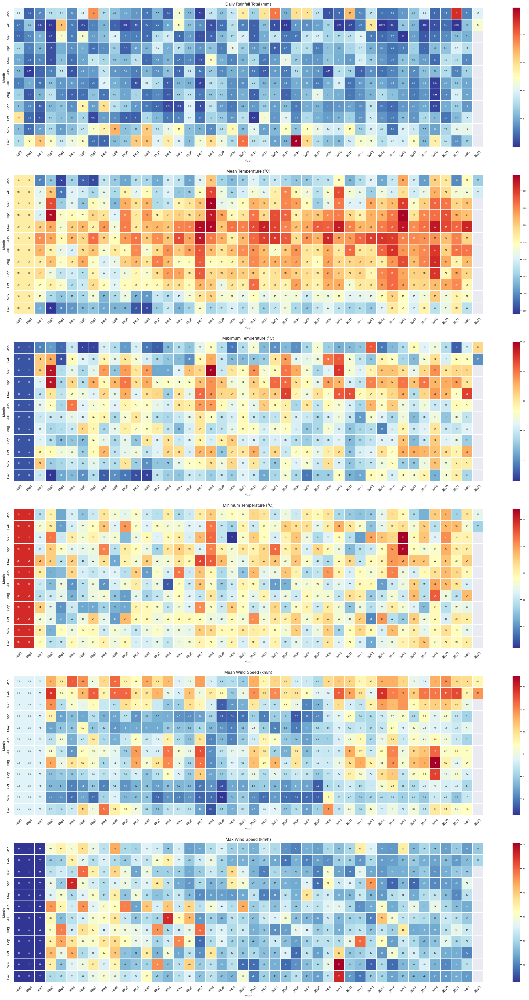

In [53]:
# establish figure size
plt.subplots(figsize=(30, 50))
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

# subplot #1
# plt.subplot(6, 1, 1) means we have 6 rows, 1 column, and are referencing plot 1.
ax1 = plt.subplot(6, 1, 1) 
ax1.set_title('Daily Rainfall Total (mm)', fontsize=12)
ax1.set_xlabel('Group', fontsize=10)
ax1.set_ylabel('Value', fontsize=10)
ax1.tick_params(axis='x', labelsize=10, rotation=45)
ax1.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Daily Rainfall Total (mm)', aggfunc='mean')
daily_rainfall_total = pt.reindex(months)
sns.heatmap(daily_rainfall_total, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax1)
sns.set(font_scale=0.5)

# subplot #2
# plt.subplot(6, 1, 2) means we have 6 rows, 1 column, and are referencing plot 2.
ax2 = plt.subplot(6, 1, 2) 
ax2.set_title('Mean Temperature (°C)', fontsize=12)
ax2.set_xlabel('Group', fontsize=10)
ax2.set_ylabel('Value', fontsize=10)
ax2.tick_params(axis='x', labelsize=10, rotation=45)
ax2.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Mean Temperature (°C)', aggfunc='mean')
mean_temperature = pt.reindex(months)
sns.heatmap(mean_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax2)
sns.set(font_scale=0.5)

# subplot #3
# plt.subplot(6, 1, 3) means we have 6 rows, 1 column, and are referencing plot 3.
ax3 = plt.subplot(6, 1, 3) 
ax3.set_title('Maximum Temperature (°C)', fontsize=12)
ax3.set_xlabel('Group', fontsize=10)
ax3.set_ylabel('Value', fontsize=10)
ax3.tick_params(axis='x', labelsize=10, rotation=45)
ax3.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Maximum Temperature (°C)', aggfunc='max')
maximum_temperature = pt.reindex(months)
sns.heatmap(maximum_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax3)
sns.set(font_scale=0.5)

# subplot #4
# plt.subplot(6, 1, 4) means we have 6 rows, 1 column, and are referencing plot 4.
ax4 = plt.subplot(6, 1, 4) 
ax4.set_title('Minimum Temperature (°C)', fontsize=12)
ax4.set_xlabel('Group', fontsize=10)
ax4.set_ylabel('Value', fontsize=10)
ax4.tick_params(axis='x', labelsize=10, rotation=45)
ax4.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Minimum Temperature (°C)', aggfunc='min')
minimum_temperature = pt.reindex(months)
sns.heatmap(minimum_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax4)
sns.set(font_scale=0.5)

# subplot #5
# plt.subplot(6, 1, 5) means we have 6 rows, 1 column, and are referencing plot 5.
ax5 = plt.subplot(6, 1, 5) 
ax5.set_title('Mean Wind Speed (km/h)', fontsize=12)
ax5.set_xlabel('Group', fontsize=10)
ax5.set_ylabel('Value', fontsize=10)
ax5.tick_params(axis='x', labelsize=10, rotation=45)
ax5.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Mean Wind Speed (km/h)', aggfunc='mean')
mean_wind_speed = pt.reindex(months)
sns.heatmap(mean_wind_speed, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax5)
sns.set(font_scale=0.5)

# subplot #6
# plt.subplot(6, 1, 6) means we have 6 rows, 1 column, and are referencing plot 6.
ax6 = plt.subplot(6, 1, 6) 
ax6.set_title('Max Wind Speed (km/h)', fontsize=12)
ax6.set_xlabel('Group', fontsize=10)
ax6.set_ylabel('Value', fontsize=10)
ax6.tick_params(axis='x', labelsize=10, rotation=45)
ax6.tick_params(axis='y', labelsize=10)
pt = climate_daily.pivot_table(index='Month', columns='Year', values='Max Wind Speed (km/h)', aggfunc='max')
max_wind_speed = pt.reindex(months)
sns.heatmap(max_wind_speed, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax6)
sns.set(font_scale=0.5)

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_6022/2312356199.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(6, 1, 1)


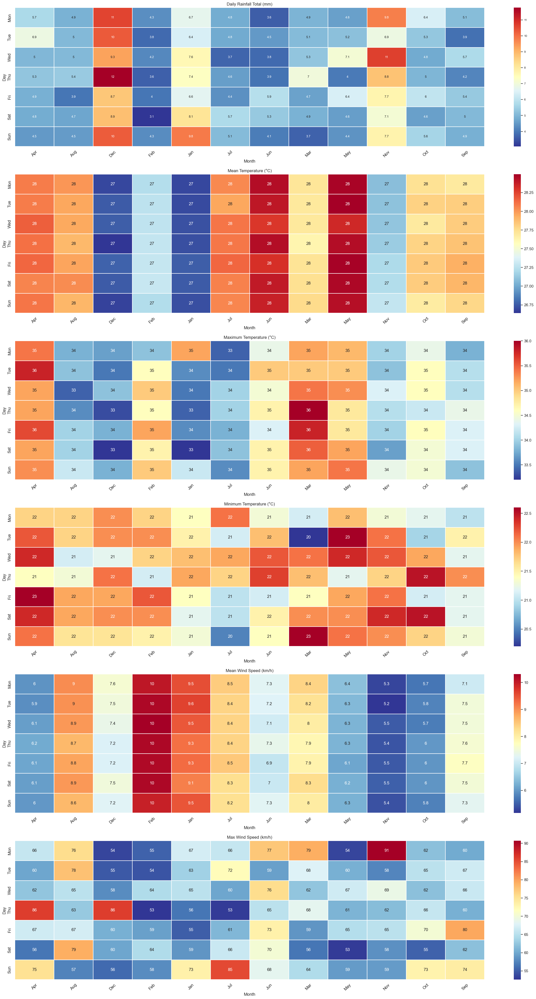

In [58]:
# establish figure size
plt.subplots(figsize=(30, 50))
days = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

# subplot #1
# plt.subplot(6, 1, 1) means we have 6 rows, 1 column, and are referencing plot 1.
ax1 = plt.subplot(6, 1, 1) 
ax1.set_title('Daily Rainfall Total (mm)', fontsize=12)
ax1.set_xlabel('Group', fontsize=12)
ax1.set_ylabel('Value', fontsize=12)
ax1.tick_params(axis='x', labelsize=12, rotation=45)
ax1.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Daily Rainfall Total (mm)', aggfunc='mean')
daily_rainfall_total = pt.reindex(days)
sns.heatmap(daily_rainfall_total, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax1)
sns.set(font_scale=1)

# subplot #2
# plt.subplot(6, 1, 2) means we have 6 rows, 1 column, and are referencing plot 2.
ax2 = plt.subplot(6, 1, 2) 
ax2.set_title('Mean Temperature (°C)', fontsize=12)
ax2.set_xlabel('Group', fontsize=12)
ax2.set_ylabel('Value', fontsize=12)
ax2.tick_params(axis='x', labelsize=12, rotation=45)
ax2.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Mean Temperature (°C)', aggfunc='mean')
mean_temperature = pt.reindex(days)
sns.heatmap(mean_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax2)
sns.set(font_scale=1)

# subplot #3
# plt.subplot(6, 1, 3) means we have 6 rows, 1 column, and are referencing plot 3.
ax3 = plt.subplot(6, 1, 3) 
ax3.set_title('Maximum Temperature (°C)', fontsize=12)
ax3.set_xlabel('Group', fontsize=12)
ax3.set_ylabel('Value', fontsize=12)
ax3.tick_params(axis='x', labelsize=12, rotation=45)
ax3.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Maximum Temperature (°C)', aggfunc='max')
maximum_temperature = pt.reindex(days)
sns.heatmap(maximum_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax3)
sns.set(font_scale=1)

# subplot #4
# plt.subplot(6, 1, 4) means we have 6 rows, 1 column, and are referencing plot 4.
ax4 = plt.subplot(6, 1, 4) 
ax4.set_title('Minimum Temperature (°C)', fontsize=12)
ax4.set_xlabel('Group', fontsize=12)
ax4.set_ylabel('Value', fontsize=12)
ax4.tick_params(axis='x', labelsize=12, rotation=45)
ax4.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Minimum Temperature (°C)', aggfunc='min')
minimum_temperature = pt.reindex(days)
sns.heatmap(minimum_temperature, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax4)
sns.set(font_scale=1)

# subplot #5
# plt.subplot(6, 1, 5) means we have 6 rows, 1 column, and are referencing plot 5.
ax5 = plt.subplot(6, 1, 5) 
ax5.set_title('Mean Wind Speed (km/h)', fontsize=12)
ax5.set_xlabel('Group', fontsize=12)
ax5.set_ylabel('Value', fontsize=12)
ax5.tick_params(axis='x', labelsize=12, rotation=45)
ax5.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Mean Wind Speed (km/h)', aggfunc='mean')
mean_wind_speed = pt.reindex(days)
sns.heatmap(mean_wind_speed, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax5)
sns.set(font_scale=1)

# subplot #6
# plt.subplot(6, 1, 6) means we have 6 rows, 1 column, and are referencing plot 6.
ax6 = plt.subplot(6, 1, 6) 
ax6.set_title('Max Wind Speed (km/h)', fontsize=12)
ax6.set_xlabel('Group', fontsize=12)
ax6.set_ylabel('Value', fontsize=12)
ax6.tick_params(axis='x', labelsize=12, rotation=45)
ax6.tick_params(axis='y', labelsize=12)
pt = climate_daily.pivot_table(index='Day', columns='Month', values='Max Wind Speed (km/h)', aggfunc='max')
max_wind_speed = pt.reindex(days)
sns.heatmap(max_wind_speed, linewidths = 0.3, annot=True, cmap='RdYlBu_r', ax=ax6)
sns.set(font_scale=1)

## 2. Read merged dataset from 2018 to 2020 <a id="2"></a>

###  Import all datasets.

In [71]:
# import merged_df
merged_df1 = pd.read_csv("../datasets/merged_df1.csv")

# Convert the time column to datetime format
merged_df1['time'] = pd.to_datetime(merged_df1['time'])

In [68]:
merged_df1.head(3)

,time,dengue_cases,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),recent_cases_in_cluster_central,recent_cases_in_cluster_east,recent_cases_in_cluster_north,recent_cases_in_cluster_north-east,recent_cases_in_cluster_west,google_trends
0,2018-04-08,38,0.0,0.505,0.484,0.011,28.528571,10.714286,0.742857,33.8,36.7,25.5,2.0,10.0,2.0,2.0,7.0,20
1,2018-04-15,56,0.0,0.505,0.484,0.011,28.914286,9.828571,2.057143,34.4,38.2,24.6,7.0,6.0,1.0,2.0,6.0,18
2,2018-04-22,55,0.0,0.505,0.484,0.011,28.142857,7.700000,0.371429,34.3,37.1,25.5,8.0,7.0,1.0,2.0,11.0,21


In [72]:
merged_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135 entries, 0 to 134
Data columns (total 18 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   time                                135 non-null    datetime64[ns]
 1   dengue_cases                        135 non-null    int64         
 2   denv_1                              135 non-null    float64       
 3   denv_2                              135 non-null    float64       
 4   denv_3                              135 non-null    float64       
 5   denv_4                              135 non-null    float64       
 6   Mean Temperature (°C)               135 non-null    float64       
 7   Mean Wind Speed (km/h)              135 non-null    float64       
 8   Daily Rainfall Total (mm)           135 non-null    float64       
 9   Maximum Temperature (°C)            135 non-null    float64       
 10  Max Wind Speed (km/h)     

---
### Regression Line to Explore Relationships between Features

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_27192/1365568668.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(merged_df1.corr(), dtype=None)
/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_27192/1365568668.py:11: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(merged_df1.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)


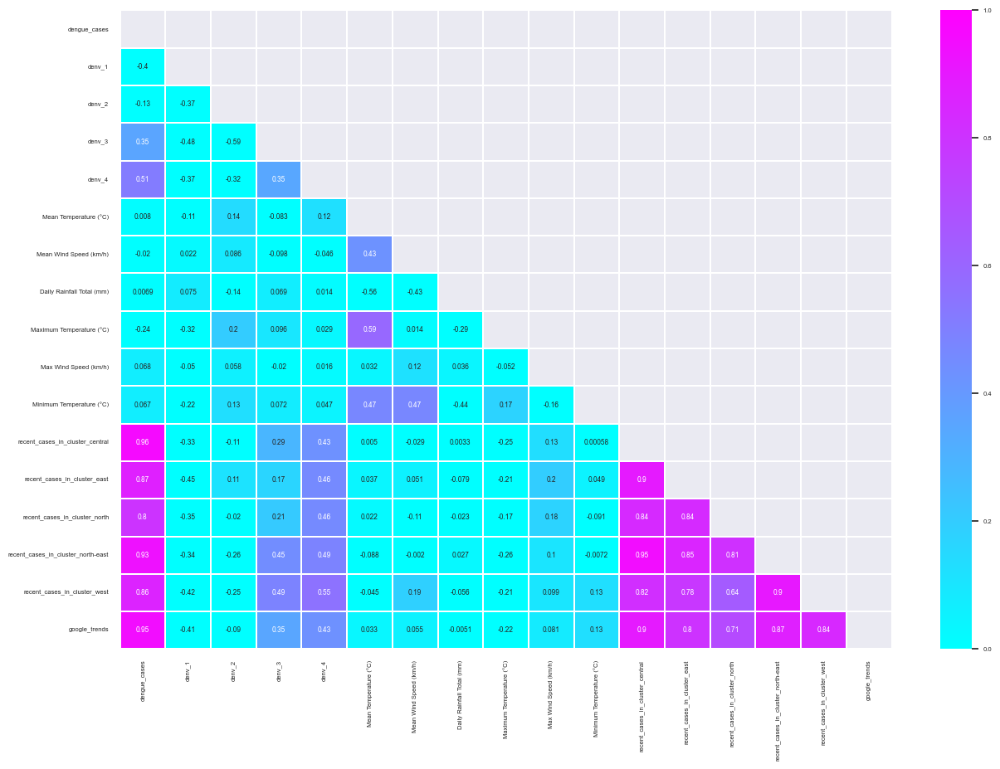

In [106]:
# First use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features
# Establish figure size
fig = plt.subplots(figsize=(15, 10))

# Create a mask for the top half (repeated values) of the heat map
mask = np.zeros_like(merged_df1.corr(), dtype=None)
mask[np.triu_indices_from(mask)]=True

# Plot the correlation heat map
sns.heatmap(merged_df1.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)
sns.set(font_scale=0.75)

# Display the heat map
plt.show();

---
### Time Series Line Plots

#### Minimum, Maximum, Mean Temperature Data collected at Changi Station from 2018 to 2020

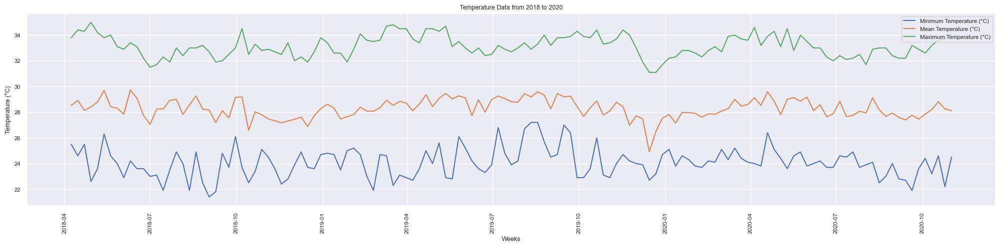

In [120]:
# Temperature Data over the weeks, 2018 -2020
plt.figure(figsize=(25, 5))

# Define X and y
x = merged_df1['time']
y = merged_df1[['Minimum Temperature (°C)', 'Mean Temperature (°C)', 'Maximum Temperature (°C)']]

plt.plot(x,y)

plt.title(label='Temperature Data from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Temperature (°C)')
plt.xticks(rotation=90)

# Add legend
plt.legend(['Minimum Temperature (°C)', 'Mean Temperature (°C)', 'Maximum Temperature (°C)'], loc='upper right');

#### Mean and Maximum Wind Speed Data collected at Changi Station from 2018 to 2020

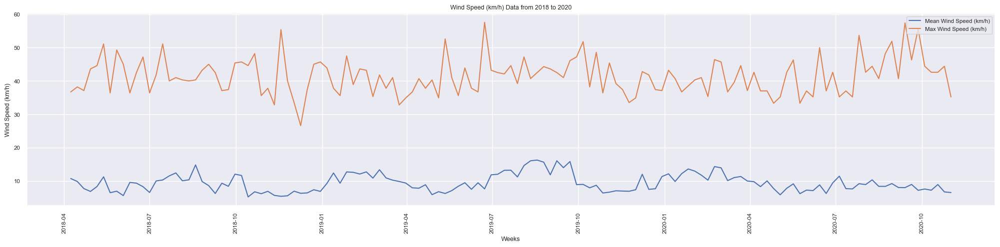

In [118]:
# Wind Speed Data over the weeks, 2018-2020
plt.figure(figsize=(25, 5))

# Define X and y
x = merged_df1['time']
y = merged_df1[['Mean Wind Speed (km/h)', 'Max Wind Speed (km/h)']]

plt.plot(x,y)

plt.title(label='Wind Speed (km/h) Data from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Wind Speed (km/h)')
plt.xticks(rotation=90)

# Add legend
plt.legend(['Mean Wind Speed (km/h)', 'Max Wind Speed (km/h)'], loc='upper right');

#### Daily Rainfall Total (mm) collected at Changi Station from 2018 to 2020

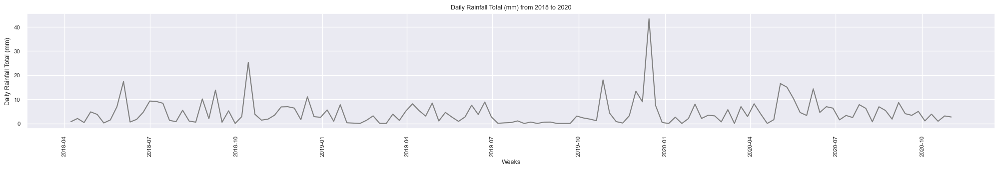

In [125]:
# Daily Rainfall Total(mm) over the weeks, 2018-2020
plt.figure(figsize=(25, 3))

# Define X and y
x = merged_df1['time']
y = merged_df1['Daily Rainfall Total (mm)']

plt.plot(x,y, color='grey')

plt.title(label='Daily Rainfall Total (mm) from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Daily Rainfall Total (mm)')
plt.xticks(rotation=90);

#### Combined Serotype Data from 2018 to 2020

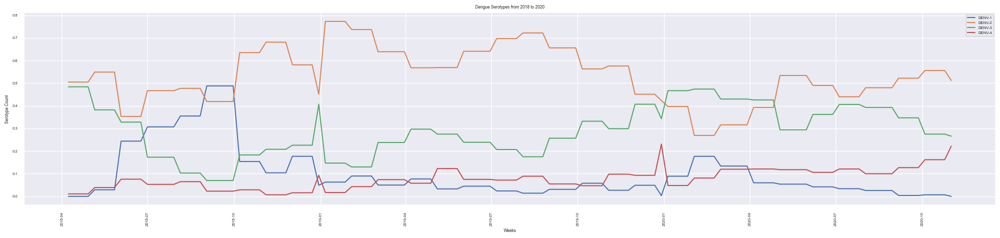

In [11]:
# Zoom into specific time period 2018 - 2020
# Dengue Cases over the weeks
plt.figure(figsize=(25, 5))

# Define X and y
x = merged_df1['time']
y = merged_df1[['denv_1', 'denv_2', 'denv_3', 'denv_4']]

plt.plot(x,y)

plt.title(label='Dengue Serotypes from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Serotype Count')
plt.xticks(rotation=90)

# Add legend
plt.legend(['DENV-1', 'DENV-2', 'DENV-3', 'DENV-4'], loc='upper right');

#### Total Dengue Cases by Region from 2018 to 2020

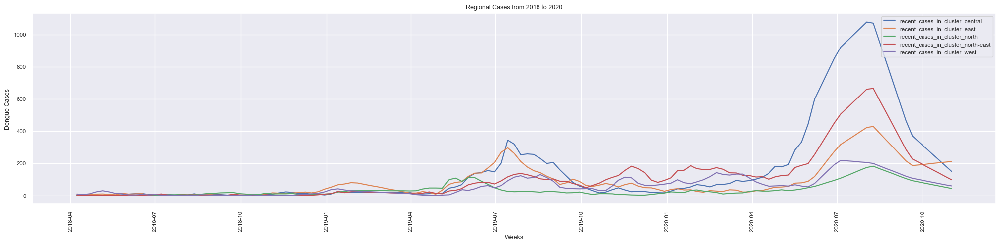

In [134]:
# Regional Dengue Cases over the weeks, 2018 -2020
plt.figure(figsize=(25, 5))

# Define X and y
x = merged_df1['time']
y = merged_df1[['recent_cases_in_cluster_central',
               'recent_cases_in_cluster_east', 
               'recent_cases_in_cluster_north',
               'recent_cases_in_cluster_north-east',
               'recent_cases_in_cluster_west']]

plt.plot(x,y)

plt.title(label='Regional Cases from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Dengue Cases')
plt.xticks(rotation=90)

# Add legend
plt.legend(['recent_cases_in_cluster_central',
            'recent_cases_in_cluster_east', 
            'recent_cases_in_cluster_north',
            'recent_cases_in_cluster_north-east',
            'recent_cases_in_cluster_west'], loc='upper right');

#### Google Search Trends from 2018 to 2020

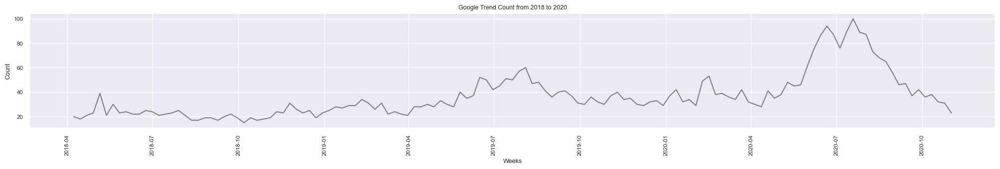

In [135]:
# Daily Rainfall Total(mm) over the weeks, 2018-2020
plt.figure(figsize=(25, 3))

# Define X and y
x = merged_df1['time']
y = merged_df1['google_trends']

plt.plot(x,y, color='grey')

plt.title(label='Google Trend Count from 2018 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Count')
plt.xticks(rotation=90);

## 3. Region dengue data from 2015 to 2020 <a id="3"></a>

In [2]:
planning_area = gpd.read_file('../datasets/dengue_cases_regional/planning-boundary-area.kml')
planning_area

,Name,Description,geometry
0,kml_1,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.81740 1.29433 0.00000, 103.817..."
1,kml_2,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.77445 1.39029 0.00000, 103.774..."
2,kml_3,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.79766 1.34813 0.00000, 103.798..."
3,kml_4,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.80578 1.41436 0.00000, 103.805..."
4,kml_5,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.98693 1.39794 0.00000, 103.987..."
5,kml_6,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.74660 1.40541 0.00000, 103.746..."
6,kml_7,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.76707 1.33120 0.00000, 103.767..."
7,kml_8,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.88152 1.38774 0.00000, 103.882..."
8,kml_9,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.74350 1.34451 0.00000, 103.744..."
9,kml_10,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.72813 1.34888 0.00000, 103.728..."


In [3]:
# Import dengue by clusters region data
region_df = pd.read_csv("../datasets/dengue_clusters_by_region.csv")

# Convert the time column to datetime format
region_df['date'] = pd.to_datetime(region_df['date'])

region_df.head(3)

,date,recent_cases_in_cluster_central,recent_cases_in_cluster_east,recent_cases_in_cluster_north,recent_cases_in_cluster_north-east,recent_cases_in_cluster_west
0,2015-07-05,65.0,25.0,22.0,15.0,9.0
1,2015-07-12,54.0,27.0,34.0,15.0,6.0
2,2015-07-19,45.0,29.0,37.0,15.0,5.0


In [4]:
region_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279 entries, 0 to 278
Data columns (total 6 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   date                                279 non-null    datetime64[ns]
 1   recent_cases_in_cluster_central     279 non-null    float64       
 2   recent_cases_in_cluster_east        279 non-null    float64       
 3   recent_cases_in_cluster_north       279 non-null    float64       
 4   recent_cases_in_cluster_north-east  279 non-null    float64       
 5   recent_cases_in_cluster_west        279 non-null    float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 13.2 KB


In [5]:
# Import the latitude/longitude data
coordinates = pd.read_csv("../datasets/regions.csv")
coordinates

,REGION_N,geometry
0,CENTRAL REGION,POINT (103.8404361073424 1.354955429489439)
1,EAST REGION,POINT (103.9633839670078 1.32796829772857)
2,NORTH REGION,POINT (103.8371178947091 1.415039440959387)
3,NORTH-EAST REGION,POINT (103.8678180616185 1.365201551765161)
4,WEST REGION,POINT (103.7049024145101 1.341611988409421)


In [6]:
coordinates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   REGION_N  5 non-null      object
 1   geometry  5 non-null      object
dtypes: object(2)
memory usage: 208.0+ bytes


---
### Regression Line to Explore Relationships between Features

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_5061/2446512648.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(region_df.corr(), dtype=None)
/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_5061/2446512648.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(region_df.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)


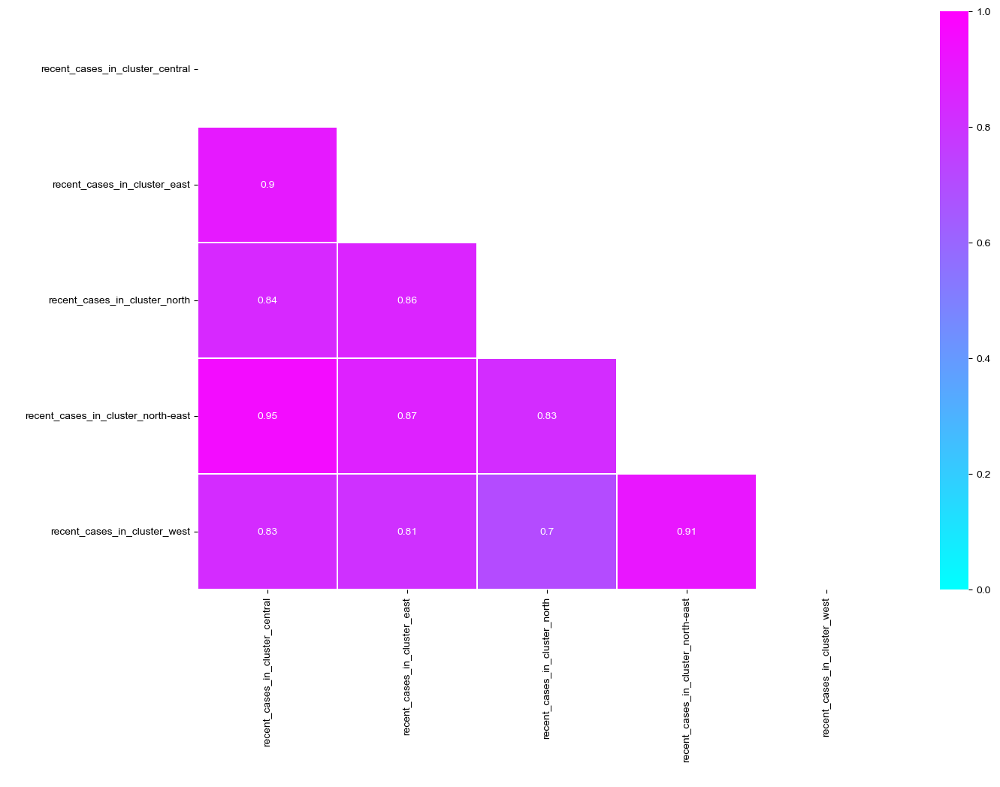

In [7]:
# First use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features
# Establish figure size
fig = plt.subplots(figsize=(15, 10))

# Create a mask for the top half (repeated values) of the heat map
mask = np.zeros_like(region_df.corr(), dtype=None)
mask[np.triu_indices_from(mask)]=True

# Plot the correlation heat map
sns.heatmap(region_df.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)
sns.set(font_scale=0.5)

# Display the heat map
plt.show();

---
### Time Series Line Plots

#### Total Dengue Cases by Region from 2015 to 2020

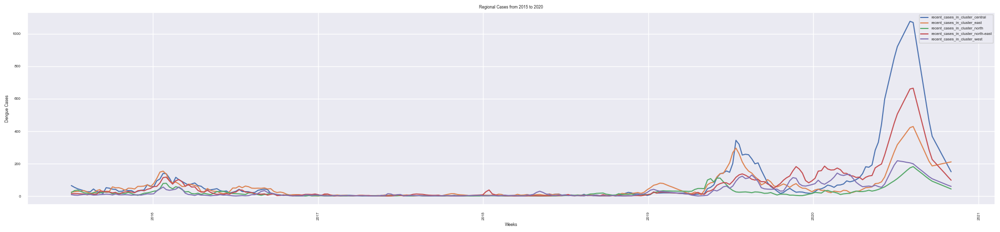

In [8]:
# Regional Dengue Cases over the weeks, 2015 -2020
plt.figure(figsize=(25, 5))

# Define X and y
x = region_df['date']
y = region_df[['recent_cases_in_cluster_central',
               'recent_cases_in_cluster_east', 
               'recent_cases_in_cluster_north',
               'recent_cases_in_cluster_north-east',
               'recent_cases_in_cluster_west']]

plt.plot(x,y)

plt.title(label='Regional Cases from 2015 to 2020')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Dengue Cases')
plt.xticks(rotation=90)

# Add legend
plt.legend(['recent_cases_in_cluster_central',
            'recent_cases_in_cluster_east', 
            'recent_cases_in_cluster_north',
            'recent_cases_in_cluster_north-east',
            'recent_cases_in_cluster_west'], loc='upper right');

---
### Folium Plot

Plotting markers on the Singapore Map to show where the 5 different clusters are.

In [9]:
from folium.features import DivIcon

In [10]:
# Creating Basemap (sg_map) on which markers will be places
fig=Figure(width=950,height=550)
sg_map=folium.Map(location=[1.354955429489439, 103.8404361073424],tiles='cartodbpositron',zoom_start=10)
fig.add_child(sg_map)

# Adding circles to the sg_map
folium.Marker(location=[1.354955429489439, 103.8404361073424],
              popup='<strong>CENTRAL REGION</strong>',
              tooltip='<strong>Click here to see Popup</strong>').add_to(sg_map)

folium.Marker(location=[1.32796829772857, 103.9633839670078],
              popup='<strong>EAST REGION</strong>',
              tooltip='<strong>Click here to see Popup</strong>').add_to(sg_map)

folium.Marker(location=[1.415039440959387, 103.8371178947091],
              popup='<strong>NORTH REGION</strong>',
              tooltip='<strong>Click here to see Popup</strong>').add_to(sg_map)

folium.Marker(location=[1.365201551765161, 103.8678180616185],
              popup='<strong>NORTH-EAST REGION</strong>',
              tooltip='<strong>Click here to see Popup</strong>').add_to(sg_map)

folium.Marker(location=[1.341611988409421, 103.7049024145101],
              popup='<strong>WEST REGION</strong>',
              tooltip='<strong>Click here to see Popup</strong>').add_to(sg_map)

# Adding markers to the sg_map
folium.Marker(location=[1.354955429489439, 103.8404361073424],
              icon=DivIcon(icon_size=(30,30),
                           icon_anchor=(20,5),
                           html=f'<div style="font-size: 10pt; color: red;">%s</div>' % str('central'))).add_to(sg_map)

folium.Marker(location=[1.32796829772857, 103.9633839670078],
              icon=DivIcon(icon_size=(30,30),
                           icon_anchor=(12.5,5),
                           html=f'<div style="font-size: 10pt; color: green;">%s</div>' % str('east'))).add_to(sg_map)

folium.Marker(location=[1.415039440959387, 103.8371178947091],
              icon=DivIcon(icon_size=(30,30),
                           icon_anchor=(15,5),
                           html=f'<div style="font-size: 10pt; color: green;">%s</div>' % str('north'))).add_to(sg_map)

folium.Marker(location=[1.365201551765161, 103.8678180616185],
              icon=DivIcon(icon_size=(30,30),
                           icon_anchor=(20,5),
                           html=f'<div style="font-size: 10pt; color: red;">%s</div>' % str('northeast'))).add_to(sg_map)

folium.Marker(location=[1.341611988409421, 103.7049024145101],
              icon=DivIcon(icon_size=(30,30),
                           icon_anchor=(15,5),
                           html=f'<div style="font-size: 10pt; color: blue;">%s</div>' % str('west'))).add_to(sg_map)

sg_map

Convert KML file, ‘planning-boundary-area.kml’, into a GeoJSON, ‘planning-boundary-area.geojson’ using an online tool.

In [11]:
# Read ‘planning-boundary-area.geojson’ and add it to sg_map
geo_json_map = geojson.load(open('../datasets/dengue_cases_regional/planning-boundary-area.geojson'))

folium.Choropleth(
    geo_data = geo_json_map,
    fill_color = "steelblue",
    fill_opacity = 0.4,
    line_color = "steelblue",
    line_opacity = 0.9
).add_to(sg_map)

sg_map

Pre-process datasets to visualize changes in the number of dengue cases with respect to time.
> * `region_df.csv` should contain variables `date`, label encoded `Region_ID`, and `color` - to be converted into `data_dictionary` with specific format
> * `planning_area.geojson` should contain label encoded `Region_ID` and `Geometry`

1. Create data_dictionary with dengue cases over time.

In [12]:
# Check orginal columns of region_df.csv
region_df.columns

Index(['date', 'recent_cases_in_cluster_central',
       'recent_cases_in_cluster_east', 'recent_cases_in_cluster_north',
       'recent_cases_in_cluster_north-east', 'recent_cases_in_cluster_west'],
      dtype='object')

In [13]:
region_df

,date,recent_cases_in_cluster_central,recent_cases_in_cluster_east,recent_cases_in_cluster_north,recent_cases_in_cluster_north-east,recent_cases_in_cluster_west
0,2015-07-05,65.0,25.0,22.0,15.0,9.0
1,2015-07-12,54.0,27.0,34.0,15.0,6.0
2,2015-07-19,45.0,29.0,37.0,15.0,5.0
3,2015-07-26,39.0,31.0,29.0,14.0,8.0
4,2015-08-02,33.0,34.0,21.0,13.0,10.0
...,...,...,...,...,...,...
274,2020-10-04,296.0,194.0,76.0,183.0,91.0
275,2020-10-11,259.0,199.0,68.0,162.0,83.0
276,2020-10-18,223.0,203.0,60.0,141.0,75.0
277,2020-10-25,186.0,207.0,52.0,119.0,67.0


In [14]:
# Melt the DataFrame
df_melted = region_df.melt(id_vars=['date'], var_name='region', value_name='cases')

# Extract the region name from the column name
df_melted['region'] = df_melted['region'].str.replace('recent_cases_in_cluster_', '').str.replace('-', ' ')

# Sort the DataFrame by date
df_melted = df_melted.sort_values('date')

# Print df_melted
df_melted

,date,region,cases
0,2015-07-05,central,65.0
558,2015-07-05,north,22.0
837,2015-07-05,north east,15.0
1116,2015-07-05,west,9.0
279,2015-07-05,east,25.0
...,...,...,...
557,2020-11-01,east,211.0
836,2020-11-01,north,44.0
278,2020-11-01,central,150.0
1115,2020-11-01,north east,98.0


In [15]:
df_melted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1395 entries, 0 to 1394
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    1395 non-null   datetime64[ns]
 1   region  1395 non-null   object        
 2   cases   1395 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 43.6+ KB


In [16]:
# Create dictionary for the purpose of label encoding the planning_areas
id_dict={'central': '0',
         'west': '1',
         'north': '2',
         'east': '3',
         'north east': '4'}

# Create IDs using the above dictionary
df_melted['region_id']=df_melted['region'].map(id_dict)

In [17]:
# Check out the full range of cases
# Maximum number of cases
print(f'The maximum number of cases is {max(df_melted.cases)}.')

# Minimum number of cases
print(f'The minimum number of cases is {min(df_melted.cases)}.')

The maximum number of cases is 1077.0.
The minimum number of cases is 1.0.


In [18]:
# Divide the range of cases into 10 bins and assign each part a color
# Assign a color to each day of every planning_area based on the total number of active dengue cases
bins=np.linspace(0,1078,11)
bins

array([   0. ,  107.8,  215.6,  323.4,  431.2,  539. ,  646.8,  754.6,
        862.4,  970.2, 1078. ])

In [19]:
# Coloring planning areas with active dengue cases
df_melted['color']=pd.cut(df_melted['cases'],bins,labels=['#FFE6C7',
                                                          '#FFE0B2',
                                                          '#FFCC80',
                                                          '#FFB74D', 
                                                          '#FFA726', 
                                                          '#FF9800', 
                                                          '#F57C00', 
                                                          '#EF6C00', 
                                                          '#E65100', 
                                                          '#FF5722'],include_lowest=False)

# Coloring planning areas with no active cases but previously had
df_melted['color'].replace(np.nan,'#32CD32',inplace=True)

In [20]:
# Isolate required three columns of the dataset for further analysis
folium_csv=df_melted[['date','region_id','color']]
folium_csv.head()

,date,region_id,color
0,2015-07-05,0,#FFE6C7
558,2015-07-05,2,#FFE6C7
837,2015-07-05,4,#FFE6C7
1116,2015-07-05,1,#FFE6C7
279,2015-07-05,3,#FFE6C7


In [21]:
# TimeSliderChoropleth takes time in milliseconds and also takes the whole dataset in the form of an area name indexed dictionary
folium_csv['date']=(folium_csv['date'].astype(int)// 10**9).astype('U10')
dengue_dict={}

for i in folium_csv['region_id'].unique():
    dengue_dict[i]={}
    for j in folium_csv[folium_csv['region_id']==i].set_index(['region_id']).values:   
        dengue_dict[i][j[0]]={'color':j[1],'opacity':0.7}

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_5061/3480454319.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  folium_csv['date']=(folium_csv['date'].astype(int)// 10**9).astype('U10')


In [22]:
folium_csv.head(25)

,date,region_id,color
0,1436054400,0,#FFE6C7
558,1436054400,2,#FFE6C7
837,1436054400,4,#FFE6C7
1116,1436054400,1,#FFE6C7
279,1436054400,3,#FFE6C7
1,1436659200,0,#FFE6C7
559,1436659200,2,#FFE6C7
838,1436659200,4,#FFE6C7
280,1436659200,3,#FFE6C7
1117,1436659200,1,#FFE6C7


In [23]:
list(dengue_dict.items())[0] 

('0',
 {'1436054400': {'color': '#FFE6C7', 'opacity': 0.7},
  '1436659200': {'color': '#FFE6C7', 'opacity': 0.7},
  '1437264000': {'color': '#FFE6C7', 'opacity': 0.7},
  '1437868800': {'color': '#FFE6C7', 'opacity': 0.7},
  '1438473600': {'color': '#FFE6C7', 'opacity': 0.7},
  '1439078400': {'color': '#FFE6C7', 'opacity': 0.7},
  '1439683200': {'color': '#FFE6C7', 'opacity': 0.7},
  '1440288000': {'color': '#FFE6C7', 'opacity': 0.7},
  '1440892800': {'color': '#FFE6C7', 'opacity': 0.7},
  '1441497600': {'color': '#FFE6C7', 'opacity': 0.7},
  '1442102400': {'color': '#FFE6C7', 'opacity': 0.7},
  '1442707200': {'color': '#FFE6C7', 'opacity': 0.7},
  '1443312000': {'color': '#FFE6C7', 'opacity': 0.7},
  '1443916800': {'color': '#FFE6C7', 'opacity': 0.7},
  '1444521600': {'color': '#FFE6C7', 'opacity': 0.7},
  '1445126400': {'color': '#FFE6C7', 'opacity': 0.7},
  '1445731200': {'color': '#FFE6C7', 'opacity': 0.7},
  '1446336000': {'color': '#FFE6C7', 'opacity': 0.7},
  '1446940800': {'colo

2. GeoJSON must be string serialized according to the planning_area name.

In [24]:
planning_boundary_area=gpd.read_file('../datasets/dengue_cases_regional/planning-boundary-area.geojson')
planning_boundary_area

,Name,PLN_AREA_N,PLN_AREA_C,CA_IND,REGION_N,REGION_C,INC_CRC,FMEL_UPD_D,geometry
0,kml_1,BUKIT MERAH,BM,False,CENTRAL REGION,CR,5321BA51A092CCC2,20191206144714,"POLYGON Z ((103.81740 1.29433 0.00000, 103.817..."
1,kml_2,BUKIT PANJANG,BP,False,WEST REGION,WR,6C222E4C54F9F0F7,20191206144714,"POLYGON Z ((103.77445 1.39029 0.00000, 103.774..."
2,kml_3,BUKIT TIMAH,BT,False,CENTRAL REGION,CR,6CCDADD1F85173E9,20191206144714,"POLYGON Z ((103.79766 1.34813 0.00000, 103.798..."
3,kml_4,CENTRAL WATER CATCHMENT,CC,False,NORTH REGION,NR,9F30125764C74984,20191206144714,"POLYGON Z ((103.80578 1.41436 0.00000, 103.805..."
4,kml_5,CHANGI,CH,False,EAST REGION,ER,6F32A6036888B139,20191206144714,"POLYGON Z ((103.98693 1.39794 0.00000, 103.987..."
5,kml_6,CHOA CHU KANG,CK,False,WEST REGION,WR,5224CD5C7960361F,20191206144714,"POLYGON Z ((103.74660 1.40541 0.00000, 103.746..."
6,kml_7,CLEMENTI,CL,False,WEST REGION,WR,1B547582113C390E,20191206144714,"POLYGON Z ((103.76707 1.33120 0.00000, 103.767..."
7,kml_8,HOUGANG,HG,False,NORTH-EAST REGION,NER,6B18B43959CDE4EB,20191206144714,"POLYGON Z ((103.88152 1.38774 0.00000, 103.882..."
8,kml_9,JURONG EAST,JE,False,WEST REGION,WR,97CD8E4DB8DA2A0D,20191206144714,"POLYGON Z ((103.74350 1.34451 0.00000, 103.744..."
9,kml_10,JURONG WEST,JW,False,WEST REGION,WR,15407CC4B888BDB5,20191206144714,"POLYGON Z ((103.72813 1.34888 0.00000, 103.728..."


In [25]:
# Extract only relevant columns
planning_boundary_area.drop(['Name',
                             'PLN_AREA_N',
                             'PLN_AREA_C', 
                             'CA_IND', 
                             'REGION_C',
                             'INC_CRC', 
                             'FMEL_UPD_D'], axis=1, inplace=True)

planning_boundary_area 

,REGION_N,geometry
0,CENTRAL REGION,"POLYGON Z ((103.81740 1.29433 0.00000, 103.817..."
1,WEST REGION,"POLYGON Z ((103.77445 1.39029 0.00000, 103.774..."
2,CENTRAL REGION,"POLYGON Z ((103.79766 1.34813 0.00000, 103.798..."
3,NORTH REGION,"POLYGON Z ((103.80578 1.41436 0.00000, 103.805..."
4,EAST REGION,"POLYGON Z ((103.98693 1.39794 0.00000, 103.987..."
5,WEST REGION,"POLYGON Z ((103.74660 1.40541 0.00000, 103.746..."
6,WEST REGION,"POLYGON Z ((103.76707 1.33120 0.00000, 103.767..."
7,NORTH-EAST REGION,"POLYGON Z ((103.88152 1.38774 0.00000, 103.882..."
8,WEST REGION,"POLYGON Z ((103.74350 1.34451 0.00000, 103.744..."
9,WEST REGION,"POLYGON Z ((103.72813 1.34888 0.00000, 103.728..."


In [26]:
# Create dictionary for the purpose of label encoding the region_n
id_dict={'CENTRAL REGION': '0',
         'WEST REGION': '1',
         'NORTH REGION': '2',
         'EAST REGION': '3',
         'NORTH-EAST REGION': '4'}

# Create IDs using the above dictionary
planning_boundary_area['region_id']=planning_boundary_area['REGION_N'].map(id_dict)
planning_boundary_area.drop(columns='REGION_N',inplace=True)

In [27]:
# Group region_ids into 5 different categories
planning_boundary_area.region_id.unique()

array(['0', '1', '2', '3', '4'], dtype=object)

In [28]:
planning_boundary_area.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   geometry   55 non-null     geometry
 1   region_id  55 non-null     object  
dtypes: geometry(1), object(1)
memory usage: 1008.0+ bytes


In [29]:
# Create a new geo_json DataFrame 
# Create a new dictionary with the required format
new_data = {'region_id': planning_boundary_area['region_id'].unique(),
            'geometry': [list() for _ in range(5)]}

In [30]:
# Loop through the data dictionary and append the data to the new dictionary
for index, row in planning_boundary_area.iterrows():
    if row['region_id'] == '0': 
        new_data['geometry'][0].append(row['geometry'])
    elif row['region_id'] == '1':
        new_data['geometry'][1].append(row['geometry'])
    elif row['region_id'] == '2':
        new_data['geometry'][2].append(row['geometry']) 
    elif row['region_id'] == '3': 
        new_data['geometry'][3].append(row['geometry'])
    else:
        new_data['geometry'][4].append(row['geometry'])

In [31]:
# Create the GeoDataFrame
gdf = gpd.GeoDataFrame.from_dict(new_data)

In [32]:
# Convert the list of Polygon objects into a single MultiPolygon object
for i in range(len(gdf)):
    gdf['geometry'][i] = MultiPolygon(gdf.geometry[i])

In [33]:
gdf

,region_id,geometry
0,0,MULTIPOLYGON Z (((103.817404504805 1.294331920...
1,1,MULTIPOLYGON Z (((103.774450261573 1.390289453...
2,2,MULTIPOLYGON Z (((103.805776584821 1.414355000...
3,3,MULTIPOLYGON Z (((103.986925137504 1.397942551...
4,4,MULTIPOLYGON Z (((103.881516457454 1.387738868...


In [34]:
# Define the multipolygon coordinates for each region
central_coords = gdf.geometry[0]
east_coords = gdf.geometry[3]
north_coords = gdf.geometry[2]
northeast_coords = gdf.geometry[4]
west_coords = gdf.geometry[1]

# Create a feature group to hold the boundary outlines
boundary_group = folium.FeatureGroup(name='Region boundaries')

# Add each region boundary to the feature group
folium.GeoJson(central_coords).add_to(boundary_group)
folium.GeoJson(east_coords).add_to(boundary_group)
folium.GeoJson(north_coords).add_to(boundary_group)
folium.GeoJson(northeast_coords).add_to(boundary_group)
folium.GeoJson(west_coords).add_to(boundary_group)

# Add the feature group to the map
sg_map.add_child(boundary_group)

# Display the map
sg_map

In [37]:
# Define the multipolygon coordinates for each region
central_coords = gdf.geometry[0]
east_coords = gdf.geometry[3]
north_coords = gdf.geometry[2]
northeast_coords = gdf.geometry[4]
west_coords = gdf.geometry[1]

# Create a feature group to hold the boundary outlines
boundary_group = folium.FeatureGroup(name='Region boundaries')

# Define the colors for each region
region_colors = {
    '0': 'red',
    '3': 'green',
    '2': 'green',
    '4': 'red',
    '1': 'blue'
}

# Add each region boundary to the feature group with a different color
folium.GeoJson(central_coords, style_function=lambda x: {'color': region_colors['0'], 'weight': 2, 'opacity': 0.7}).add_to(boundary_group)
folium.GeoJson(east_coords, style_function=lambda x: {'color': region_colors['3'], 'weight': 2, 'opacity': 0.7}).add_to(boundary_group)
folium.GeoJson(north_coords, style_function=lambda x: {'color': region_colors['2'], 'weight': 2, 'opacity': 0.7}).add_to(boundary_group)
folium.GeoJson(northeast_coords, style_function=lambda x: {'color': region_colors['4'], 'weight': 2, 'opacity': 0.7}).add_to(boundary_group)
folium.GeoJson(west_coords, style_function=lambda x: {'color': region_colors['1'], 'weight': 2, 'opacity': 0.7}).add_to(boundary_group)

# Add the feature group to the map
sg_map.add_child(boundary_group)

# Display the map
sg_map

Import the TimeSliderChoropleth plugin.

In [41]:
# Add plugin to sg_map
g = TimeSliderChoropleth(
    gdf.set_index('region_id').to_json(),
    styledict=dengue_dict).add_to(sg_map)

sg_map

In [35]:
sg_map.save('sg_map.html')

Create a GIF out of a TimeSliderChoropleth.

In [36]:
type(sg_map)

folium.folium.Map

## 4. SeroType data from 2018 to 2023 <a id="4"></a>

---
### Import all datasets.

In [2]:
# Import dengue cases and serology data
serotype_df = pd.read_csv("../datasets/dengue_data_cleaned.csv")

# Convert the time column to datetime format
serotype_df['date'] = pd.to_datetime(serotype_df['date'])

# Sort dengue cases and serology data in chronological order (ascending) 
serotype_df = serotype_df.sort_values('date')

In [3]:
serotype_df.head(3)

,date,dengue_cases,denv_1,denv_2,denv_3,denv_4
221,2017-12-31,83,0.177,0.581,0.226,0.016
226,2018-01-07,68,0.423,0.192,0.321,0.064
227,2018-01-14,54,0.423,0.192,0.321,0.064


In [4]:
serotype_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 273 entries, 221 to 11
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          273 non-null    datetime64[ns]
 1   dengue_cases  273 non-null    int64         
 2   denv_1        273 non-null    float64       
 3   denv_2        273 non-null    float64       
 4   denv_3        273 non-null    float64       
 5   denv_4        273 non-null    float64       
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 14.9 KB


---
### Regression Line to Explore Relationships between Features

/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_53470/2285854857.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.zeros_like(serotype_df.corr(), dtype=None)
/var/folders/1k/lmhy97td4h17yfgn7vlzp0ph0000gp/T/ipykernel_53470/2285854857.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(serotype_df.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)


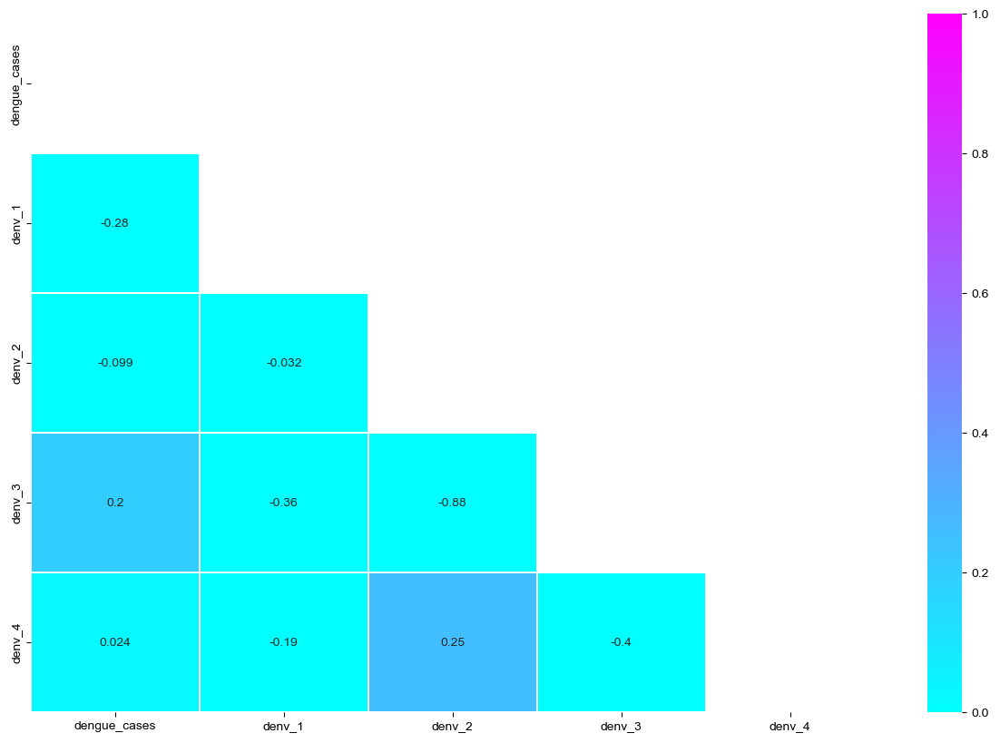

In [8]:
# First use Seaborn's heatmap with pandas `.corr()` to visualize correlations between all numeric features
# Establish figure size
fig = plt.subplots(figsize=(15, 10))

# Create a mask for the top half (repeated values) of the heat map
mask = np.zeros_like(serotype_df.corr(), dtype=None)
mask[np.triu_indices_from(mask)]=True

# Plot the correlation heat map
sns.heatmap(serotype_df.corr(), vmin=0.0, vmax=1.0, mask=mask, cmap='cool', annot=True, linewidths = 0.3)
sns.set(font_scale=0.5)

# Display the heat map
plt.show();

---
### Time Series Line Plots

#### Dengue Cases from 2018 to 2023

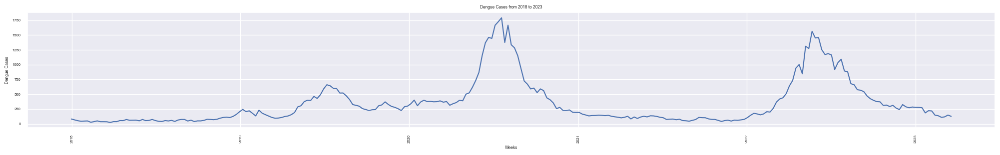

In [9]:
# Dengue Cases over the weeks
plt.figure(figsize=(25, 3))

x = serotype_df['date']
y = serotype_df['dengue_cases']

plt.plot(x,y)

plt.title(label='Dengue Cases from 2018 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Dengue Cases')
plt.xticks(rotation=90);

#### Combined Serotype Data from 2018 to 2023

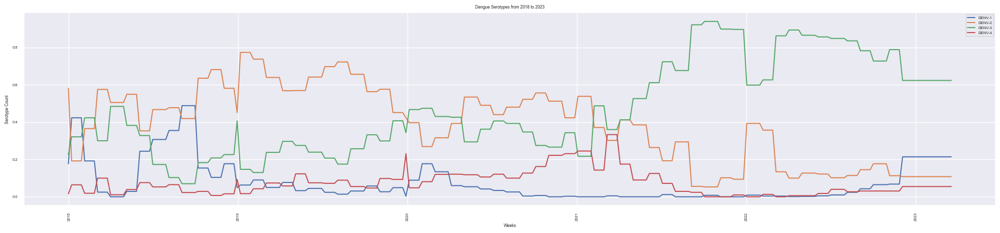

In [10]:
# Dengue Cases over the weeks
plt.figure(figsize=(25, 5))

# Define X and y
x = serotype_df['date']
y = serotype_df[['denv_1', 'denv_2', 'denv_3', 'denv_4']]

plt.plot(x,y)

plt.title(label='Dengue Serotypes from 2018 to 2023')
plt.xlabel(xlabel='Weeks')
plt.ylabel(ylabel='Serotype Count')
plt.xticks(rotation=90)

# Add legend
plt.legend(['DENV-1', 'DENV-2', 'DENV-3', 'DENV-4'], loc='upper right');

## 5. Read Merged dataset from 2018 to 2023 <a id="5"></a>

* Weekly nationwide dengue cases ranges from 38 to 1791 from 2018 to 2023
* Weekly dengue cases averages at 362
* DENV 1 and DENV 4 strains is usually low, with average below 10% of weekly dengue cases
* DENV_3 and DENV_2 averages about 40% of the weekly dengue cases
* Maximum weekly temperature is about 35 degree celcius
* Minimum weekly temperature is about 24 degree celcius
* Average weekly temperature is about 28 degree celcius
* Average weekly rainfall is about 5.9 mm, but the maximum is 78.2 mm 
* The anomalously high rainfall 78.2 mm comes from last week data (2023-03-05) is based on average of 2 days (27-Feb and 28-Feb 2023) due to lack of data.
* 28 Feb 2023 alone recorded 154 mm of rainfall

In [5]:
df = pd.read_csv('../datasets/merged_df2.csv')
df['time'] = pd.to_datetime(df['time'], format = '%Y-%m-%d')
df.set_index('time',inplace=True)
df.head()


,dengue_cases,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),google_trends
time,,,,,,,,,,,,
2018-04-08,38,0.000,0.505,0.484,0.011,28.528571,10.714286,0.742857,33.8,36.7,25.5,20
2018-04-15,56,0.000,0.505,0.484,0.011,28.914286,9.828571,2.057143,34.4,38.2,24.6,18
2018-04-22,55,0.000,0.505,0.484,0.011,28.142857,7.700000,0.371429,34.3,37.1,25.5,21
2018-04-29,74,0.000,0.505,0.484,0.011,28.414286,6.842857,4.800000,35.0,43.6,22.6,23
2018-05-06,62,0.029,0.549,0.382,0.039,28.785714,8.328571,3.742857,34.2,44.6,23.6,39


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 257 entries, 2018-04-08 to 2023-03-05
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   dengue_cases               257 non-null    int64  
 1   denv_1                     257 non-null    float64
 2   denv_2                     257 non-null    float64
 3   denv_3                     257 non-null    float64
 4   denv_4                     257 non-null    float64
 5   Mean Temperature (°C)      257 non-null    float64
 6   Mean Wind Speed (km/h)     257 non-null    float64
 7   Daily Rainfall Total (mm)  257 non-null    float64
 8   Maximum Temperature (°C)   257 non-null    float64
 9   Max Wind Speed (km/h)      257 non-null    float64
 10  Minimum Temperature (°C)   257 non-null    float64
 11  google_trends              257 non-null    int64  
dtypes: float64(10), int64(2)
memory usage: 26.1 KB


In [7]:
df.isnull().sum()

dengue_cases                 0
denv_1                       0
denv_2                       0
denv_3                       0
denv_4                       0
Mean Temperature (°C)        0
Mean Wind Speed (km/h)       0
Daily Rainfall Total (mm)    0
Maximum Temperature (°C)     0
Max Wind Speed (km/h)        0
Minimum Temperature (°C)     0
google_trends                0
dtype: int64

In [8]:
df.describe()

,dengue_cases,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),google_trends
count,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000,257.000000
mean,362.451362,0.068144,0.386284,0.471533,0.074128,28.029906,8.868521,5.920233,32.999222,41.407393,23.880934,32.879377
std,379.512154,0.100712,0.205676,0.251201,0.067611,0.854411,2.454965,7.906792,0.862183,5.651678,1.036476,16.151536
min,38.000000,0.000000,0.053000,0.070000,0.000000,24.842857,5.114286,0.000000,30.500000,26.600000,21.400000,13.000000
25%,107.000000,0.004000,0.145000,0.266000,0.027000,27.528571,6.900000,1.542857,32.400000,37.000000,23.200000,22.000000
50%,236.000000,0.029000,0.412000,0.407000,0.055000,28.071429,8.385714,4.000000,33.000000,40.700000,23.800000,28.000000
75%,426.000000,0.077000,0.549000,0.676000,0.106000,28.600000,10.228571,7.571429,33.500000,44.400000,24.500000,38.000000
max,1791.000000,0.488000,0.773000,0.939000,0.333000,29.728571,16.257143,78.200000,35.400000,57.600000,27.200000,100.000000


### Split data by year and explore the statistics


In [9]:
df['year'] = df.index.year
df['date'] = df.index.strftime('%m-%d')
df['week_number'] = df.index.isocalendar().week
unstacked = df.set_index(['year', 'week_number']).unstack(-2)
unstacked.head()

dengue_cases                                    denv_1         \
year                2018   2019   2020   2021   2022   2023   2018   2019   
week_number                                                                 
1                    NaN  245.0  342.0  165.0  146.0  278.0    NaN  0.063   
2                    NaN  207.0  402.0  151.0  178.0  273.0    NaN  0.063   
3                    NaN  221.0  307.0  135.0  169.0  186.0    NaN  0.063   
4                    NaN  179.0  370.0  141.0  153.0  223.0    NaN  0.063   
5                    NaN  135.0  400.0  142.0  168.0  219.0    NaN  0.090   

                         ... google_trends                   date         \
year          2020 2021  ...          2020  2021  2022  2023 2018   2019   
week_number              ...                                               
1            0.089  0.0  ...          37.0  20.0  18.0  28.0  NaN  01-06   
2            0.089  0.0  ...          42.0  20.0  20.0  26.0  NaN  01-13   
3            0.089  0.0  ...          32.0  22.0  22.0  19.0  NaN  01-20   
4            0.089  0.0  ...          34.0  19.0  21.0  25.0  NaN  01-27   
5            0.177  0.0  ...          29.0  20.0  25.0  25.0  NaN  02-03   

                                         
year          2020   2021   2022   2023  
week_number                              
1            01-05  01-10  01-09  01-08  
2            01-12  01-17  01-16  01-15  
3            01-19  01-24  01-23  01-22  
4            01-26  01-31  01-30  01-29  
5            02-02  02-07  02-06  02-05  

[5 rows x 78 columns]

In [10]:
unstacked.columns

MultiIndex([(             'dengue_cases', 2018),
            (             'dengue_cases', 2019),
            (             'dengue_cases', 2020),
            (             'dengue_cases', 2021),
            (             'dengue_cases', 2022),
            (             'dengue_cases', 2023),
            (                   'denv_1', 2018),
            (                   'denv_1', 2019),
            (                   'denv_1', 2020),
            (                   'denv_1', 2021),
            (                   'denv_1', 2022),
            (                   'denv_1', 2023),
            (                   'denv_2', 2018),
            (                   'denv_2', 2019),
            (                   'denv_2', 2020),
            (                   'denv_2', 2021),
            (                   'denv_2', 2022),
            (                   'denv_2', 2023),
            (                   'denv_3', 2018),
            (                   'denv_3', 2019),
            (       

In [11]:
df.columns

Index(['dengue_cases', 'denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends',
       'year', 'date', 'week_number'],
      dtype='object')

## 6. Dengue, Rainfall, Temperature from 2018 to 2023  <a id="6"></a>
* Frequency distribution : Histogram, Barplot
* Outliers: Boxplot

### Plot dengue time series 2012-2023
* From the above plot, the dengue cases spikes during the circuit breaker period, it might be influenced by many people staying indoors.
* Use data from original degnue cases dataset to see the pattern before 2018

In [12]:
df2 = pd.read_csv('../datasets/dengue_merged_2012_2023.csv')
df2['date'] = pd.to_datetime(df2['date'], format = '%Y-%m-%d')
df2.dropna(inplace=True)
df2 = df2.astype({"dengue_cases": int})
df2.set_index(['date'],inplace=True)
df2.head()

,dengue_cases
date,
2012-01-01,74
2012-01-08,64
2012-01-15,60
2012-01-22,50
2012-01-29,84


In [13]:
df2.isna().sum()

dengue_cases    0
dtype: int64

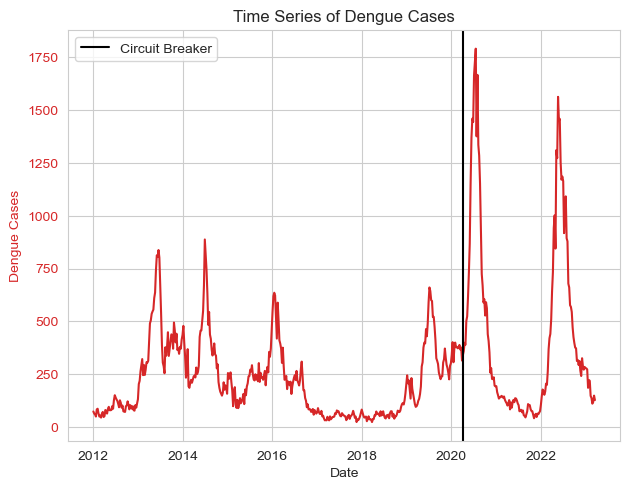

In [14]:
plot_timeseries(df2.index,df2.dengue_cases,'Dengue Cases','2020-04-03','Circuit Breaker')

### Observing the months with highest dengue cases, rainfall and temperature using bar plot (2018 to 2023)
* Dengue cases usually peaks in the months of May to August
* Overlaps with the time of lower rainfall and warmer temperatures conducive for mosquito growth and activity
* Dengue cases are significantly higher post-covid
* Typically, May to August is the spike of dengue cases every year
* The width of the dengue spikes is about 3-4 months

In [15]:
data = df['Daily Rainfall Total (mm)'].groupby(df.index.month).mean()
data.head()

time
1    7.668323
2    3.674286
3    7.416541
4    6.351429
5    5.621118
Name: Daily Rainfall Total (mm), dtype: float64

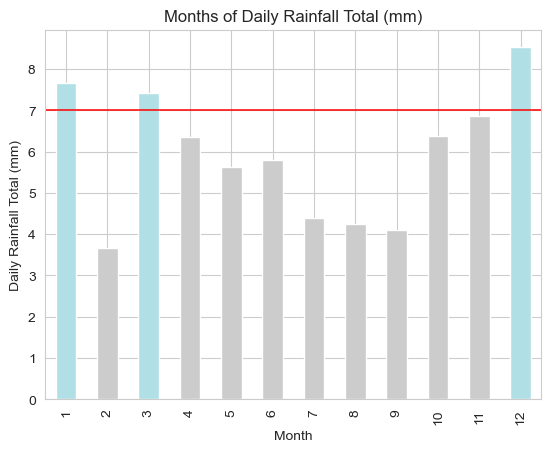

In [16]:
single_variable_barplot(df,'Daily Rainfall Total (mm)','powderblue',0.75)

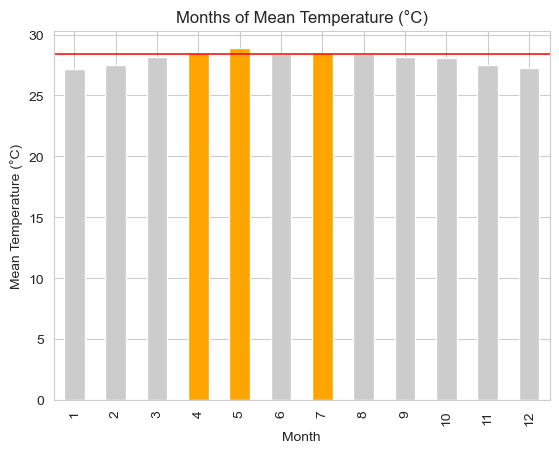

In [17]:
single_variable_barplot(df,'Mean Temperature (°C)','orange',0.75)

Text(0.5, 1.0, 'Dengue cases from 2018 to 2023')

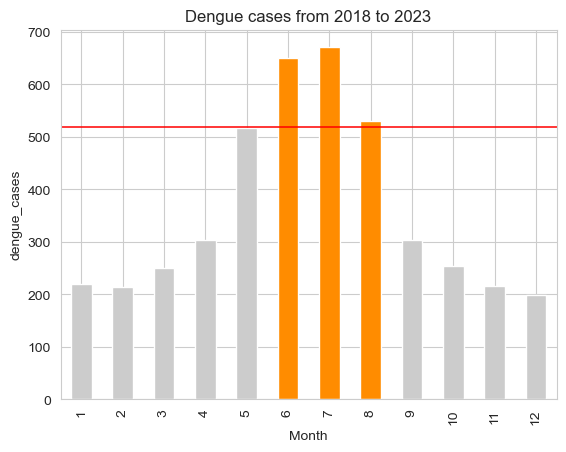

In [18]:
single_variable_barplot(df,'dengue_cases','darkorange',0.75)
plt.title('Dengue cases from 2018 to 2023')

### Temperature
* Mean temperature seems to be a left-skewed distribution
* The temperature fits the optimum average temperature for mosquito growth and activity at 25–30 °C according to https://www.sciencedirect.com/science/article/pii/S0213911121002399?via%3Dihub
* The temperature is also optimal for replication of dengue virus in the mosquito
* Temperature do not determine how high the spikes will be every year

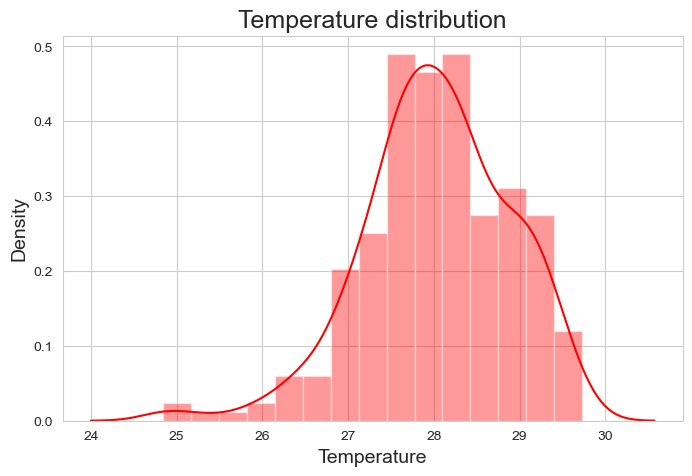

In [19]:
plt.figure(figsize=(8,5))
sns.distplot(df['Mean Temperature (°C)'],color='r')
plt.title('Temperature distribution',size=18)
plt.xlabel('Temperature',size=14)
plt.ylabel('Density',size=14)
plt.show()

In [20]:
temp_unstacked = unstacked[[('Mean Temperature (°C)', 2018),
            (    'Mean Temperature (°C)', 2019),
            (    'Mean Temperature (°C)', 2020),
            (    'Mean Temperature (°C)', 2021),
            (    'Mean Temperature (°C)', 2022),
            (    'Mean Temperature (°C)', 2023)]]
temp_unstacked.head()

Mean Temperature (°C)                                              \
year                         2018       2019       2020       2021       2022   
week_number                                                                     
1                             NaN  28.614286  27.814286  25.314286  27.428571   
2                             NaN  28.314286  27.157143  26.214286  27.557143   
3                             NaN  27.471429  27.971429  26.414286  27.514286   
4                             NaN  27.642857  27.971429  26.885714  27.871429   
5                             NaN  27.814286  27.900000  27.071429  28.057143   

                        
year              2023  
week_number             
1            27.414286  
2            27.142857  
3            27.000000  
4            24.842857  
5            26.057143

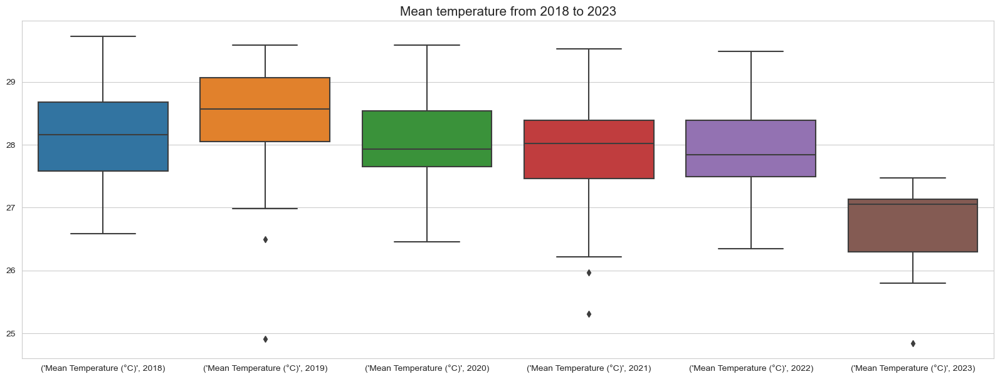

In [21]:
plt.figure(figsize = (20,7))
sns.boxplot(temp_unstacked)
plt.title('Mean temperature from 2018 to 2023',size=15)
plt.show()

### Rainfall
* Higher rainfall might create more stagnant water for mosquito to reproduce
* Around 5mm daily rainfall (Averaged by week)
* 2019,2021 weeks with very high rainfall above 40 mm on average

In [22]:
rain_unstacked = unstacked[[('Daily Rainfall Total (mm)', 2018),
            ('Daily Rainfall Total (mm)', 2019),
            ('Daily Rainfall Total (mm)', 2020),
            ('Daily Rainfall Total (mm)', 2021),
            ('Daily Rainfall Total (mm)', 2022),
            ('Daily Rainfall Total (mm)', 2023)]]
rain_unstacked.head()

Daily Rainfall Total (mm)                                 \
year                             2018      2019      2020       2021   
week_number                                                            
1                                 NaN  5.600000  0.000000  40.085714   
2                                 NaN  0.914286  2.600000   2.485714   
3                                 NaN  7.771429  0.000000   4.628571   
4                                 NaN  0.285714  2.028571   1.685714   
5                                 NaN  0.142857  8.000000   0.000000   

                                  
year             2022       2023  
week_number                       
1            1.685714   1.800000  
2            0.000000   2.200000  
3            1.285714   7.714286  
4            0.542857  28.400000  
5            3.085714   8.171429

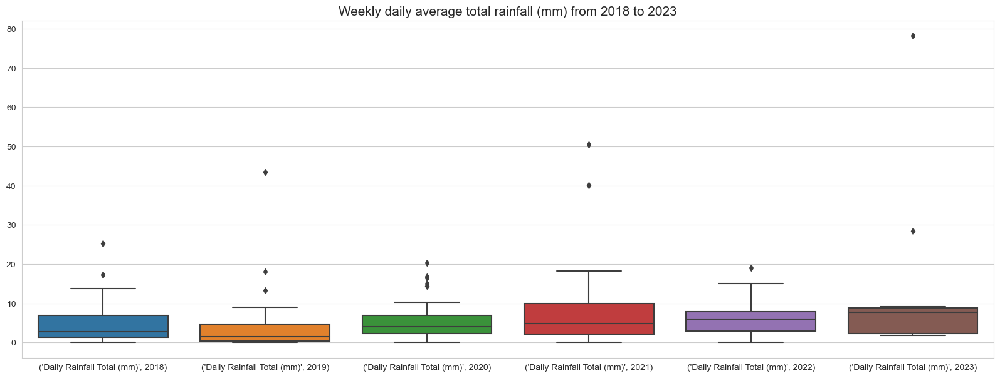

In [23]:
plt.figure(figsize = (20,7))
sns.boxplot(rain_unstacked)
plt.title('Weekly daily average total rainfall (mm) from 2018 to 2023',size=15)
plt.show()

### Wind speed
* Wind speeds may reduce mosquito population as it affects flying and stagnant water.

In [24]:
wind_unstacked = unstacked[[('Mean Wind Speed (km/h)', 2018),
            ('Mean Wind Speed (km/h)', 2019),
            ('Mean Wind Speed (km/h)', 2020),
            ('Mean Wind Speed (km/h)', 2021),
            ('Mean Wind Speed (km/h)', 2022),
            ('Mean Wind Speed (km/h)', 2023)]]
wind_unstacked.head()

Mean Wind Speed (km/h)                                   \
year                          2018       2019       2020       2021   
week_number                                                           
1                              NaN   9.257143  12.128571   7.428571   
2                              NaN  12.385714   9.828571  11.985714   
3                              NaN   9.314286  12.171429  11.157143   
4                              NaN  12.700000  13.585714  11.357143   
5                              NaN  12.585714  12.942857  12.942857   

                                   
year              2022       2023  
week_number                        
1             8.814286   8.685714  
2            11.842857   7.642857  
3            10.942857  10.642857  
4             9.885714   8.828571  
5            11.314286   9.785714

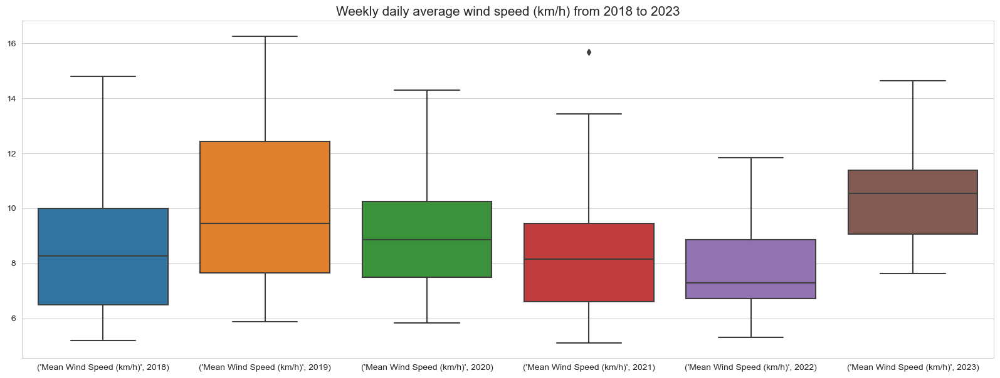

In [25]:
plt.figure(figsize = (20,7))
sns.boxplot(wind_unstacked)
plt.title('Weekly daily average wind speed (km/h) from 2018 to 2023',size=15)
plt.show()

### Dengue cases
* Dengue cases every year is very different
* From the box plot, we can see dengue spikes in 2019, 2020 (largest spike) and 2022.
* Majority of the weeks, the dengue case count is below 500

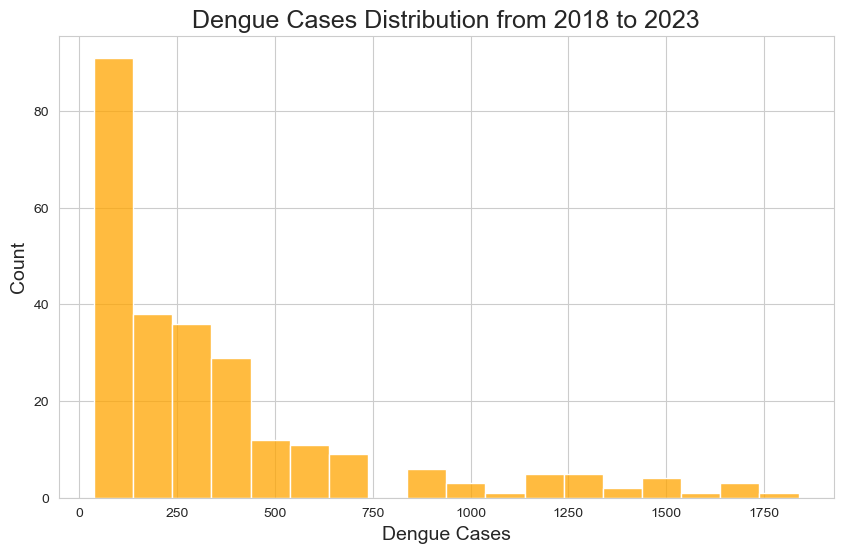

In [26]:
plt.figure(figsize=(10,6))
sns.histplot(df['dengue_cases'],color='orange', binwidth = 100)
plt.title('Dengue Cases Distribution from 2018 to 2023',size=18)
plt.xlabel('Dengue Cases',size=14)
plt.ylabel('Count',size=14)
plt.show()

In [27]:
dengue_unstacked = unstacked[[('dengue_cases', 2018),
            ('dengue_cases', 2019),
            ('dengue_cases', 2020),
            ('dengue_cases', 2021),
            ('dengue_cases', 2022),
            ('dengue_cases', 2023)]]
dengue_unstacked.head()

dengue_cases                                   
year                2018   2019   2020   2021   2022   2023
week_number                                                
1                    NaN  245.0  342.0  165.0  146.0  278.0
2                    NaN  207.0  402.0  151.0  178.0  273.0
3                    NaN  221.0  307.0  135.0  169.0  186.0
4                    NaN  179.0  370.0  141.0  153.0  223.0
5                    NaN  135.0  400.0  142.0  168.0  219.0

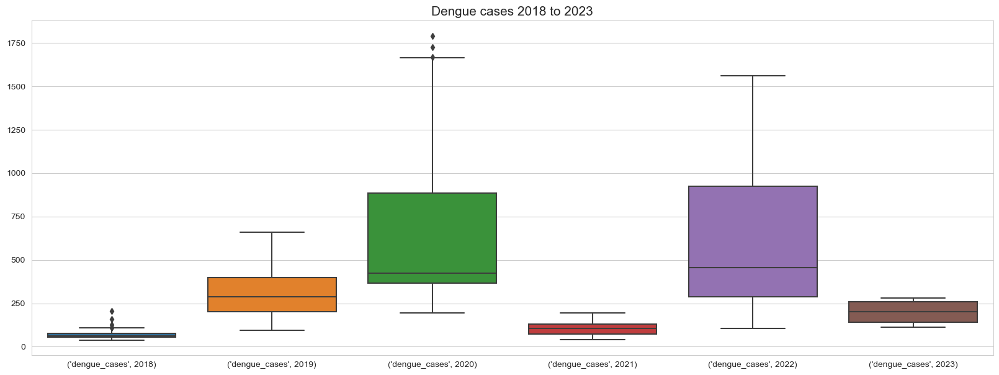

In [28]:
plt.figure(figsize = (20,7))
sns.boxplot(dengue_unstacked)
plt.title('Dengue cases 2018 to 2023',size=15)
plt.show()

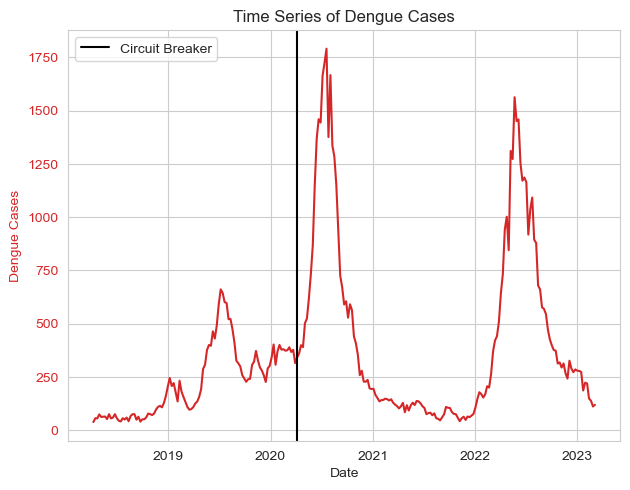

In [29]:
plot_timeseries(df.index,df.dengue_cases,'Dengue Cases','2020-04-03','Circuit Breaker')

## 7. Comparing google trends, temperature and rain with dengue from 2018-2023 <a id="7"></a>

* Bivariate analysis to find relationships between two variables.
* boxplot(categorical vs numerical)
* scatterplot or line plot (numerical vs numerical)
* The google trends spikes matches the dengue spikes

### Comparing dengue cases and google trends
* The spikes matches in time between dengue_cases and google_trends

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


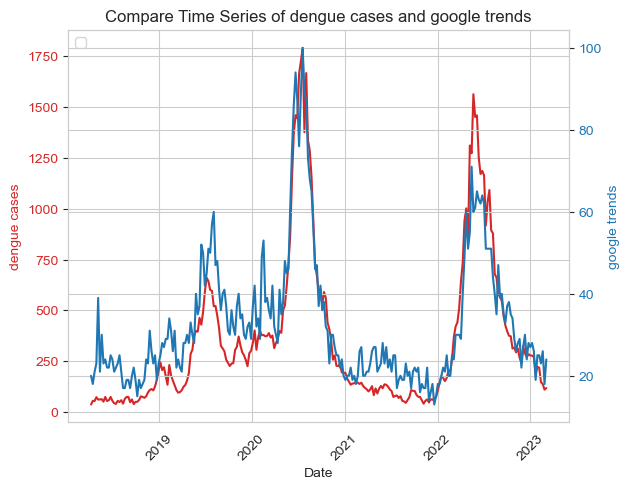

In [30]:
x=df.index
y1=df.dengue_cases
y2=df.google_trends

compare_timeseries(x,y1,'dengue cases',x,y2,'google trends')

* The 2 spikes are significantly higher than spike in 2019 after circuit breaker in 2020 April
* Vertical line is plotted on 3-Apr-23, the start of cirvuit breaker in Singapore

### Find correlation between features and dengue cases time series for 2018 to 2023
* High correlation between dengue_cases and google_trends
* Negative correlation between Mean temperature and rainfall


In [31]:
features = ['Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)','dengue_cases','google_trends']

In [32]:
dataCorr = df[features].corr(method='pearson')
dataCorr = dataCorr.mask(np.tril(np.ones(dataCorr.shape)).astype(np.bool))
dataCorr = dataCorr[abs(dataCorr) >= 0.3].stack().reset_index()
print (dataCorr)

                     level_0                    level_1         0
0      Mean Temperature (°C)  Daily Rainfall Total (mm) -0.519492
1      Mean Temperature (°C)   Maximum Temperature (°C)  0.642291
2      Mean Temperature (°C)   Minimum Temperature (°C)  0.482721
3     Mean Wind Speed (km/h)   Minimum Temperature (°C)  0.372634
4  Daily Rainfall Total (mm)   Minimum Temperature (°C) -0.446208
5               dengue_cases              google_trends  0.930977


### Checking smoothening effect using rolling window average

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


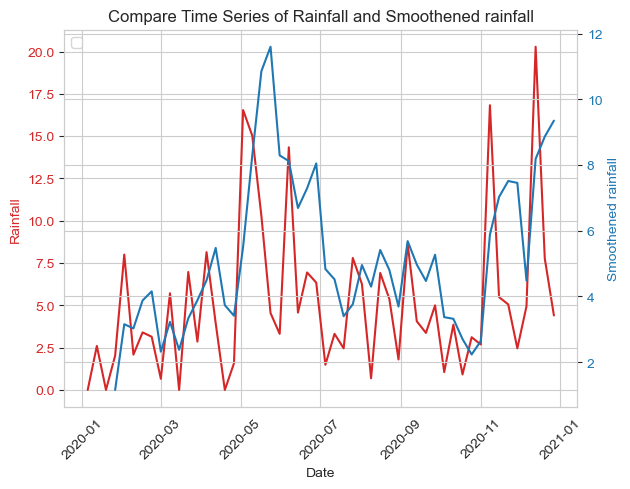

In [33]:
compare_timeseries(df[df['year']==2020].index,
                   df[df['year']==2020]['Daily Rainfall Total (mm)'],
                   'Rainfall',
                   df[df['year']==2020].index,
                   df[df['year']==2020]['Daily Rainfall Total (mm)'].rolling(4).mean(),
                   'Smoothened rainfall')

In [34]:
def compare_features(year1,year2,feature1,feature2,window):
    '''
    Function to compare feature 1 and feature 2 time series
    year1 : start year
    year2 : end year
    feature1: time series for first feature
    feature2: time series for second feature
    window: No of weeks for rolling average to smoothen the curve
    '''
    compare_timeseries(df[(df['year']>=year1) & (df['year']<=year2)].index,
                   df[(df['year']>=year1) & (df['year']<=year2)][feature1].rolling(window).mean(),
                   feature1,
                   df[(df['year']>=year1) & (df['year']<=year2)].index,
                   df[(df['year']>=year1) & (df['year']<=year2)][feature2].rolling(window).mean(),
                   feature2)

### Zoom and visualise the correlation between temperature and rainfall
* Smooth out the series with rolling window of 4 weeks
* Positive Correlation between minimum temperature and rainfall
* Negative Correlation between mean temperature and rainfall

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


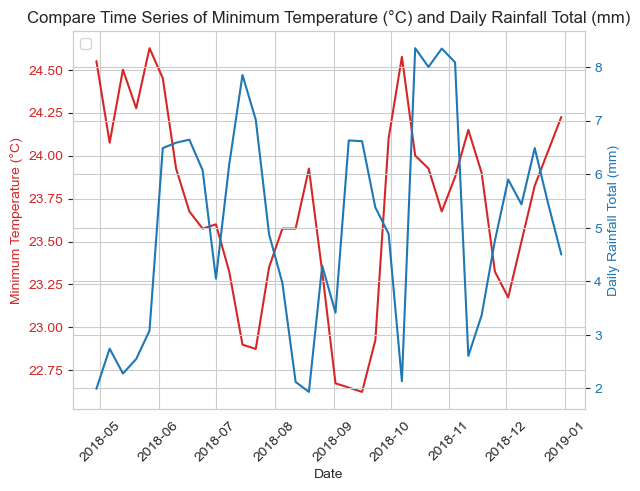

In [35]:
compare_features(2018,2018,'Minimum Temperature (°C)','Daily Rainfall Total (mm)',4)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


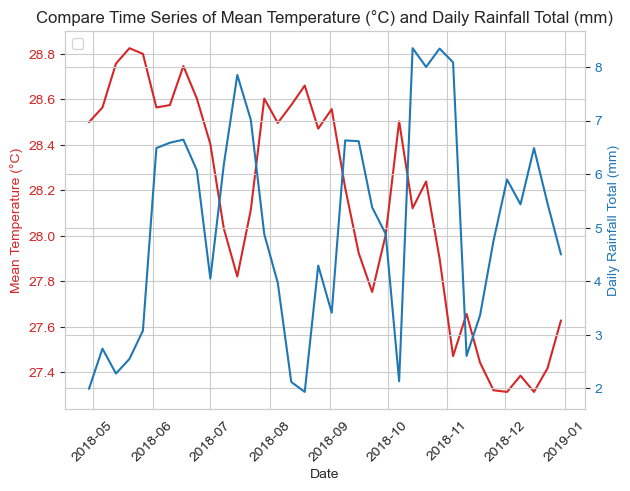

In [36]:
compare_features(2018,2018,'Mean Temperature (°C)','Daily Rainfall Total (mm)',4)

### Zooming and find relationship between rainfall and dengue cases
* Smooth out the series with rolling window of 4 weeks
* As per above findings, there is little correlation between rainfall and dengue cases
* There is a one month negative lag, usally a period of higher rainfall precedes before dengue cases spikes

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


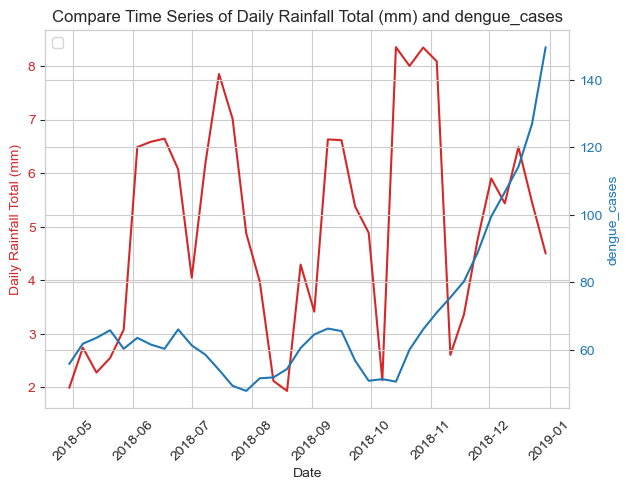

In [37]:
compare_features(2018,2018,'Daily Rainfall Total (mm)','dengue_cases',4)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


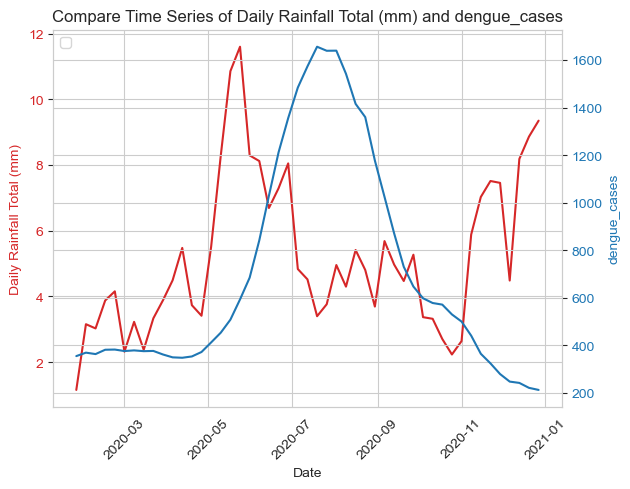

In [38]:
compare_features(2020,2020,'Daily Rainfall Total (mm)','dengue_cases',4)

### Observing the lag time between Periods of high rainfall and dengue cases
* Dengue spikes precedes with high rainfall
* Life cycle of a mosquito is 42 – 56 days for an adult female mosquito
* 8-10 days from egg to larva to pupa to adult mosquito
* Around 1 month as adult mosquito
* High rainfall usually starts 1 month before the spike in dengue cases
* Sometimes high rainfall will not result in spikes
* High temperature coincides with dengue spikes

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


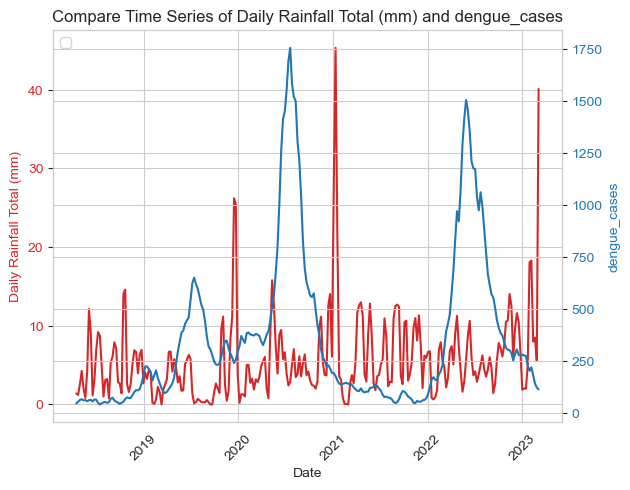

In [39]:
compare_features(2018,2023,'Daily Rainfall Total (mm)','dengue_cases',2)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


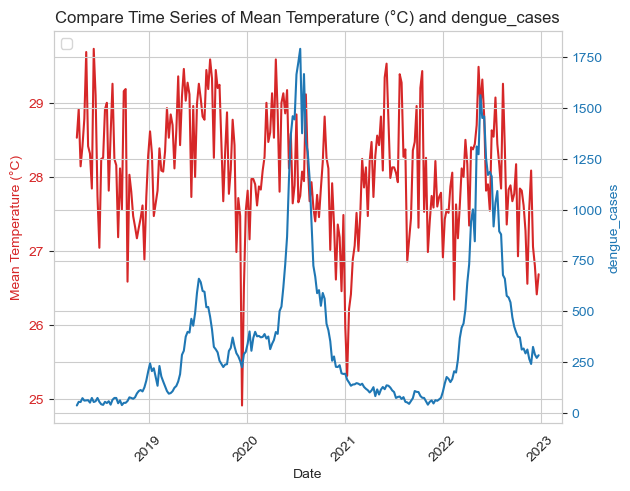

In [40]:
# Weather factors can help to predict dengue outbreaks
compare_features(2018,2022,'Mean Temperature (°C)','dengue_cases',1)

## 8. Trend, seasonal component of the dengue time series from 2018 to 2023 and 2012 to 2023 <a id="8"></a>
* Seasonal pattern: Usually peaks in July 
* Abnormally high in 2020 and 2022 July
* No peaks in 2021 July

### Dengue time series decomposition from 2018-2023

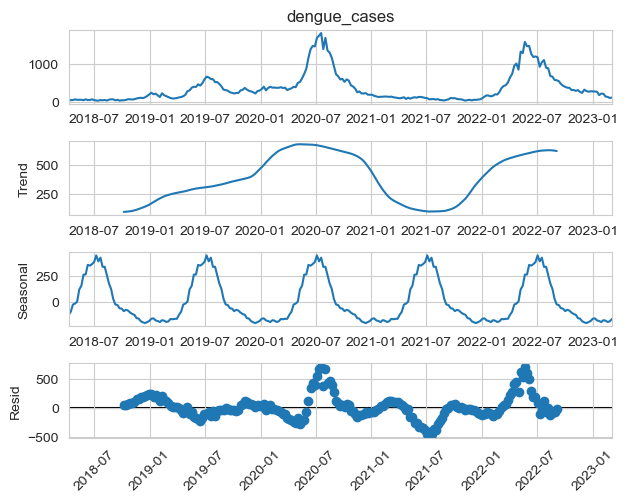

In [41]:
# 2018-2023
result = seasonal_decompose(df.dengue_cases, model='additive')
result.plot()
plt.xticks(rotation=45)
plt.show()

### Dengue time series decomposition from 2012-2023

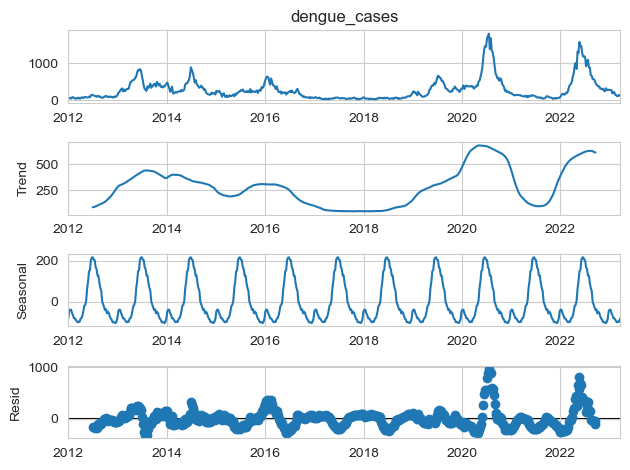

In [42]:
# 2012-2023
result = seasonal_decompose(df2.dengue_cases, model='additive')
result.plot()
plt.show()

### Google trends time series decomposition from 2018-2023

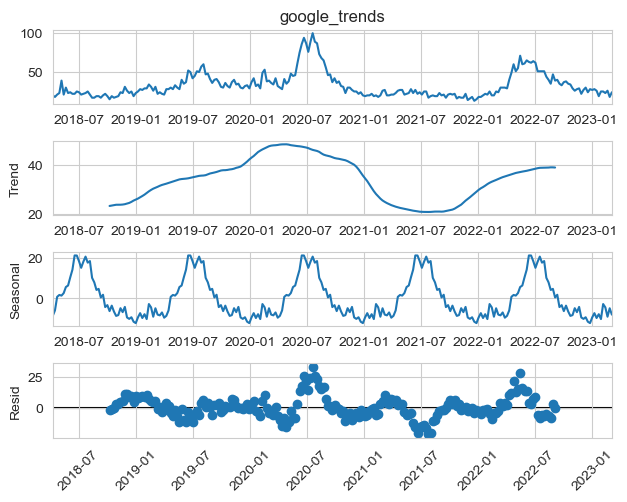

In [43]:
result = seasonal_decompose(df.google_trends, model='additive')
result.plot()
plt.xticks(rotation=45)
plt.show()

### Google trend time series decomposition from 2012-2023 (Monthly)
* Using the extended data for monthy google trends from 2012 to 2023, we can see a similar trend with dengue cases
* There is a spike in July 2016 for google searches without a corresponding significant increase in dengue cases

In [44]:
ts = pd.read_csv('../datasets/dengue_search_trends/defined_queries_2012_2023.csv', skiprows=2)
ts['Month'] = pd.to_datetime(ts['Month'], format = '%Y-%m-%d')
ts.set_index('Month',inplace=True)
ts.rename(columns={ ts.columns[0]: "google_trend" }, inplace = True)
ts.head()

,google_trend
Month,
2012-01-01,16
2012-02-01,17
2012-03-01,15
2012-04-01,18
2012-05-01,17


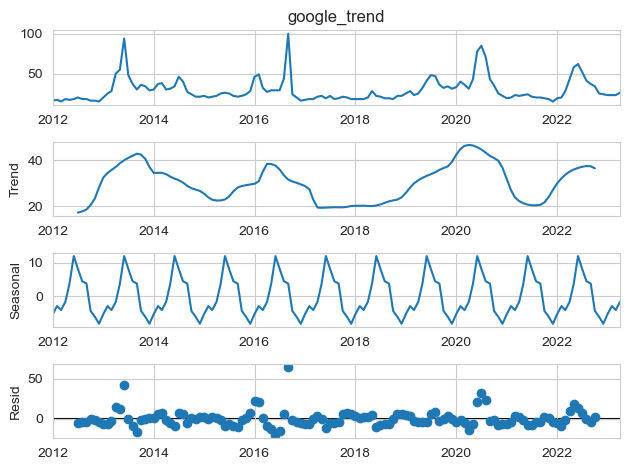

In [45]:
result = seasonal_decompose(ts.google_trend, model='additive')
result.plot()
plt.show()

### Serology time series decomposition from 2018-2023
* DENV_3 is the dominant strain from 2021 onwards
* DENV_2 percentage is falling due to immunity 

* Abnormally high spikes in July 2020 and 2022 is due to DENV_3
* DENV_3 is dropping in 2023

In [46]:
df.columns

Index(['dengue_cases', 'denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends',
       'year', 'date', 'week_number'],
      dtype='object')

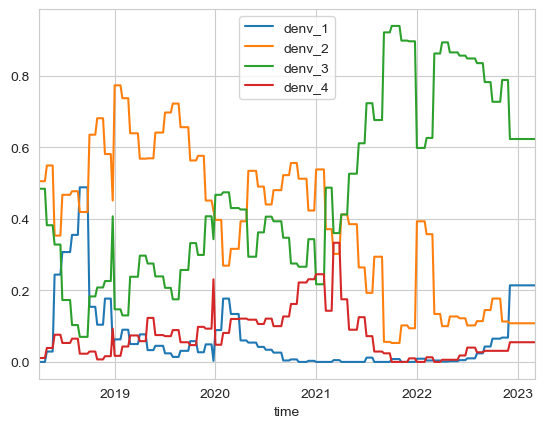

In [47]:
serology = df[['denv_1', 'denv_2', 'denv_3', 'denv_4']]
serology.plot()
plt.show()

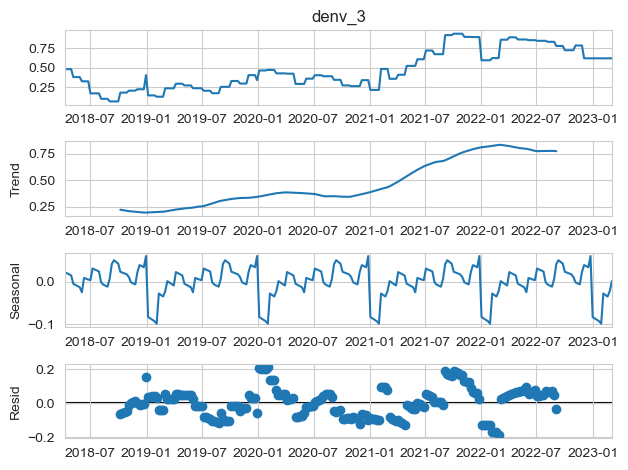

In [48]:
result = seasonal_decompose(df.denv_3, model='additive')
result.plot()
plt.show()

* DENV_1 is rising in 2023
* Subsequent dengue spikes in 2023 maybe a mixture of DENV_3 and DENV_1 cases

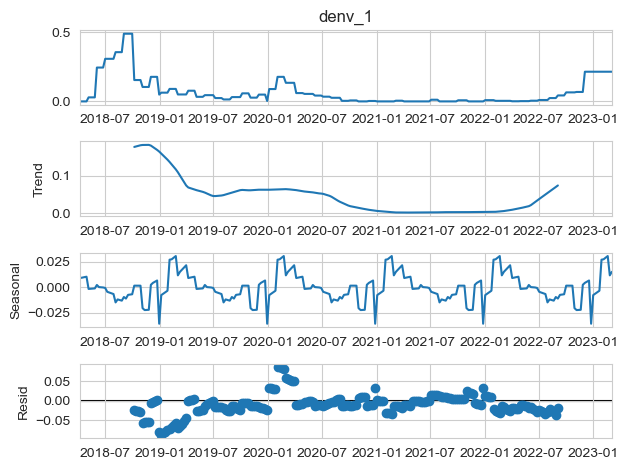

In [49]:
result = seasonal_decompose(df.denv_1, model='additive')
result.plot()
plt.show()

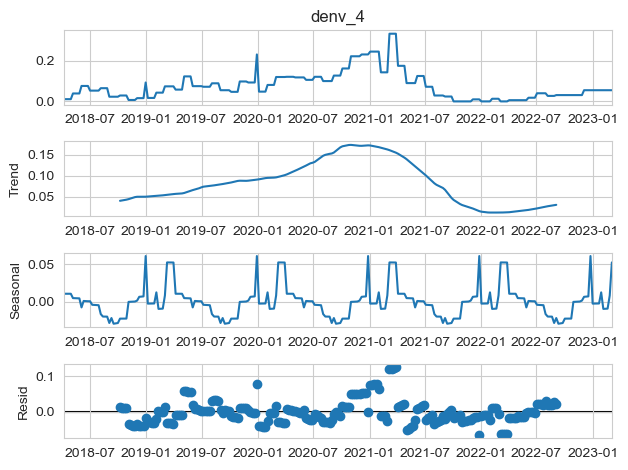

In [50]:
result = seasonal_decompose(df.denv_4, model='additive')
result.plot()
plt.show()

In [51]:
df.columns

Index(['dengue_cases', 'denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends',
       'year', 'date', 'week_number'],
      dtype='object')

In [52]:
round(df.dengue_cases*df.denv_3)

time
2018-04-08     18.0
2018-04-15     27.0
2018-04-22     27.0
2018-04-29     36.0
2018-05-06     24.0
              ...  
2023-02-05    136.0
2023-02-12     92.0
2023-02-19     86.0
2023-02-26     69.0
2023-03-05     74.0
Length: 257, dtype: float64

In [53]:
def dengue_by_serology(df,color,t1,t2):
    
    ''' 
    Function to plot stacked plots of dengue cases stratified by serology of DENV 1-4
    df: dataframe
    color: colour palette for denv strains
    t1: quantile threshold 1 e.g. 0.75
    t2. quantile threshold 2 e.g. 0.95
    '''   
    plt.figure(figsize=(12, 6))

    threshold_1 = round(df.dengue_cases.quantile(t1))
    threshold_2 = round(df.dengue_cases.quantile(t2))
    
    x = df.index
    y1= round(df.dengue_cases*df.denv_1)
    y2= round(df.dengue_cases*df.denv_2)
    y3= round(df.dengue_cases*df.denv_3)
    y4= round(df.dengue_cases*df.denv_4)
    
    # Create stackplot
    plt.stackplot(x,y3,y2,y1,y4,
                  labels=['denv_3','denv_2','denv_1','denv_4'], colors=color, alpha=0.7)
    
    plt.axhline(threshold_1, color='orange', linestyle='solid', linewidth=1.1,label=f'{round(t1*100)}th percentile ({round(threshold_1)} cases)')

    plt.axhline(threshold_2, color='red', linestyle='solid', linewidth=1.1, label=f'{round(t2*100)}th percentile ({round(threshold_2)} cases)')
       
    plt.legend(loc='upper left')
    plt.margins(0,0)
    plt.xlim(df.index.min(), df.index.max())
    plt.title('Dengue fever weekly cases, by serology', size = 25)
    plt.ylabel('Dengue Cases',size=20)
    plt.xlabel('Date',size=20)
    plt.tick_params() ;

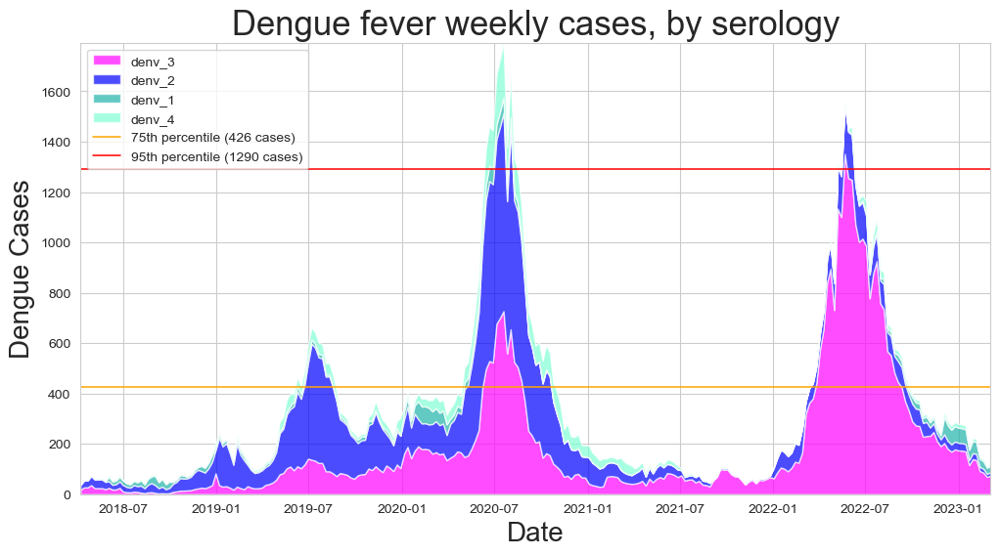

In [54]:
color = ['magenta','blue','lightseagreen','aquamarine']
dengue_by_serology(df,color,0.75, 0.95)

**Findings**
* We can observe that lack of population immunity to denv 3 (In Pink) may have influenced the large dengue cases spikes in 2020 and 2022
* Hence, we suggest combining the 4 serology features (DENV_1 to 4) into a single susceptibility ratio to reduce dimension and capture the population susceptibility to the dengue virus.
* More details on this susceptibility ratio can be found in [02 Feature engineering Notebook](../code/02_feature_engineering.ipynb)

## 9. Features lags with highest correlation  <a id="9"></a>

In [55]:
features = ['denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends']

In [56]:
shifted = df[features].shift(periods=2)
shifted.head()

,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),google_trends
time,,,,,,,,,,,
2018-04-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-04-22,0.0,0.505,0.484,0.011,28.528571,10.714286,0.742857,33.8,36.7,25.5,20.0
2018-04-29,0.0,0.505,0.484,0.011,28.914286,9.828571,2.057143,34.4,38.2,24.6,18.0
2018-05-06,0.0,0.505,0.484,0.011,28.142857,7.700000,0.371429,34.3,37.1,25.5,21.0


In [57]:
target = df['dengue_cases']
target.head()

time
2018-04-08    38
2018-04-15    56
2018-04-22    55
2018-04-29    74
2018-05-06    62
Name: dengue_cases, dtype: int64

In [58]:
data_corr = pd.concat([shifted, target], axis=1)
data_corr.head()

,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),google_trends,dengue_cases
time,,,,,,,,,,,,
2018-04-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38
2018-04-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56
2018-04-22,0.0,0.505,0.484,0.011,28.528571,10.714286,0.742857,33.8,36.7,25.5,20.0,55
2018-04-29,0.0,0.505,0.484,0.011,28.914286,9.828571,2.057143,34.4,38.2,24.6,18.0,74
2018-05-06,0.0,0.505,0.484,0.011,28.142857,7.700000,0.371429,34.3,37.1,25.5,21.0,62


In [59]:
list(range(-10, 10+1))

[-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [60]:
def get_lag_corr(df_features,target,min_lag, max_lag):
    '''
    Function to get correlation for different time lags between the features
    df_features: data frame with features as columns
    target: target series
    min_lag: maximum negative lags in weeks
    max_lag: maximum postive lags in weeks
    '''
    corr_list = pd.DataFrame()
    
    # Correlation with lags
    for i in range(min_lag,max_lag+1):
        if i == 0:
            data = pd.concat([df_features, target], axis=1)
            row = data.corr()['dengue_cases']
            t_row = pd.DataFrame(row).transpose().rename(index={'dengue_cases': 0})
            corr_list = pd.concat([corr_list, t_row], axis=0)   
        shifted = df_features.shift(periods=i)
        data = pd.concat([shifted, target], axis=1)
        row = data.corr()['dengue_cases']
        t_row = pd.DataFrame(row).transpose().rename(index={'dengue_cases': i})
        corr_list = pd.concat([corr_list, t_row], axis=0)
        
    return corr_list

In [61]:
corr_list = get_lag_corr(
    df[['denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends']],
    df['dengue_cases'],-2,2)

In [62]:
corr_list.head()

,denv_1,denv_2,denv_3,denv_4,Mean Temperature (°C),Mean Wind Speed (km/h),Daily Rainfall Total (mm),Maximum Temperature (°C),Max Wind Speed (km/h),Minimum Temperature (°C),google_trends,dengue_cases
-2,-0.259507,-0.102571,0.179043,0.032520,0.131784,-0.049076,-0.068460,-0.059598,0.051402,0.046578,0.889838,1.0
-1,-0.257472,-0.104123,0.182358,0.022484,0.159847,-0.059330,-0.076092,-0.027577,0.036470,0.065636,0.920891,1.0
0,-0.254615,-0.105002,0.185131,0.011167,0.168341,-0.079553,-0.066408,-0.018892,0.028140,0.069802,0.930977,1.0
0,-0.254615,-0.105002,0.185131,0.011167,0.168341,-0.079553,-0.066408,-0.018892,0.028140,0.069802,0.930977,1.0
1,-0.252502,-0.106549,0.188619,-0.002353,0.181789,-0.090432,-0.046568,-0.000160,0.012032,0.076440,0.917511,1.0


In [63]:
corr_list[corr_list.columns[1]]

-2   -0.102571
-1   -0.104123
 0   -0.105002
 0   -0.105002
 1   -0.106549
 2   -0.107465
Name: denv_2, dtype: float64

In [64]:
def get_groups_from_list(lst):
    result = []
    for k, g in groupby(enumerate(lst), lambda x: x[0] - x[1]):
        g = list(map(lambda x: x[1], g))
        if len(g) > 1:
            result.append([g[0], g[-1]])
        else:
            result.append([g[0]])
    return result

In [65]:
def plot_lag_corr(df_features,target,min_lag,max_lag,threshold):
    '''
    Function to visualise correlation for different time lags between the features
    df_features: data frame with features as columns
    target: target series
    min_lag: maximum negative lags in weeks
    max_lag: maximum postive lags in weeks
    threshold: Correlation value threshold to highlight week ranges
    '''
    fig, axes = plt.subplots(3, 2, sharex=True, sharey=True, figsize=(40,12))
    palette = ['k', 'm', 'b', 'c', 'g']
    corr_list = get_lag_corr(df_features,target,min_lag,max_lag)
        
    for i, ax in enumerate(axes.flatten()[:len(df_features.columns)]):
        col_index = i % 5
        data = corr_list[corr_list.columns[i]]
        ax.plot(data, color=palette[col_index])
        ax.set_xlabel('Lag (weeks)', size=25)
        ax.set_ylabel('Pearson correlation', size=25)
        ax.set_title(corr_list.columns[i], size=35)
        ax.tick_params(labelsize=15)      
        above = [i for i,v in enumerate(data) if abs(v) >= threshold]
        ax.annotate(text=f'Max: {round(max(data),2)}',xy=(min_lag,0.8), fontsize=20,color=palette[col_index])
        ax.annotate(text=f'Min: {round(min(data),2)}',xy=(min_lag,0.4), fontsize=20,color=palette[col_index])
        ranges = get_groups_from_list(above)
        lags=[]
        for i in ranges:
            if len(i)==2:
                xmin = i[0]+min_lag
                xmax = i[1]-max_lag
                if xmax>=0:
                    xmin=xmin-1
                    xmax=xmax-1
                ax.axvspan(xmin,xmax, color='red', alpha=0.15)
                lags.append([xmin,xmax])
            else:
                xmin = i[0]+min_lag
                xmax = i[0]+min_lag
                if xmax>=0:
                    xmin=xmin-1
                    xmax=xmax-1
                ax.axvspan(xmin,xmin, color='red', alpha=0.15)
                lags.append([xmin])
            
        ax.annotate(text=f'Possible Lags: {lags} weeks',xy=(min_lag,-0.8), fontsize=28,color=palette[col_index])
        ax.set_ylim(-1, 1)
        
    fig.suptitle(f'Correlation variations for different week lags over each feature', fontsize=30) 
    fig.tight_layout()
    fig.subplots_adjust(top=0.9)

In [66]:
df.columns

Index(['dengue_cases', 'denv_1', 'denv_2', 'denv_3', 'denv_4',
       'Mean Temperature (°C)', 'Mean Wind Speed (km/h)',
       'Daily Rainfall Total (mm)', 'Maximum Temperature (°C)',
       'Max Wind Speed (km/h)', 'Minimum Temperature (°C)', 'google_trends',
       'year', 'date', 'week_number'],
      dtype='object')

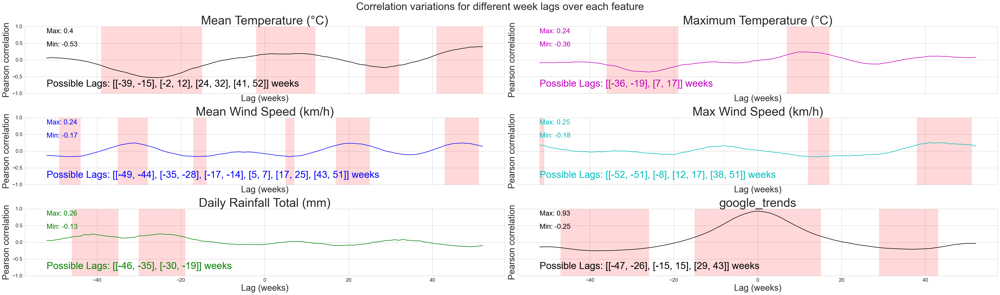

In [67]:
plot_lag_corr(df[['Mean Temperature (°C)','Maximum Temperature (°C)',
                  'Mean Wind Speed (km/h)','Max Wind Speed (km/h)',
                  'Daily Rainfall Total (mm)','google_trends']],df['dengue_cases'],-52,52,0.15)

**Findings of pearson correlation of multiple features with dengue cases with positive lags**
1. Google trends has very good correlation with no week lags
2. Mean temperature has higher correlations at 0-12, 24-32 and 41-52 week lags
3. Mean wind spead has higher correlations at 5-7, 17,25 and 43-51 week lags
4. Rainfall has no significant correlation at different week lags
5. Maximum temperature have higher correlation at 7-17 week lags
5. Maximum wind speed have higher correlation at 12-17 and 38-51 week lags

This matches with the CCF plots in [02 Feature engineering Notebook](../code/02_feature_engineering.ipynb)

Note: CCF and pearson correlation give the same results, the difference is how they treat NA values.